# Using principal components for macro trading strategies

## Get packages and JPMaQS data

### Packages

In [1]:
# >>> Define constants <<< #
import os

# Minimum Macrosynergy package version required for this notebook
MIN_REQUIRED_VERSION: str = "1.0.0"

# DataQuery credentials: Remember to replace with your own client ID and secret
DQ_CLIENT_ID: str = os.getenv("DQ_CLIENT_ID")
DQ_CLIENT_SECRET: str = os.getenv("DQ_CLIENT_SECRET")

# Define any Proxy settings required (http/https)
PROXY = {}

# Start date for the data (argument passed to the JPMaQSDownloader class)
START_DATE: str = "2000-01-01"

In [2]:
# Standard library imports
import os
import numpy as np
import pandas as pd
import seaborn as sns
import warnings
from functools import partial

# Scikit-learn imports
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

from sklearn.metrics import (
    make_scorer,
    balanced_accuracy_score,
    r2_score,
)

# Macrosynergy package imports
import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.pnl as msn
import macrosynergy.signal as mss
import macrosynergy.learning as msl
import macrosynergy.visuals as msv
from macrosynergy.download import JPMaQSDownload

warnings.simplefilter("ignore")

In [3]:
# Check installed Macrosynergy package meets version requirement
import macrosynergy as msy
msy.check_package_version(required_version=MIN_REQUIRED_VERSION)

### Data

In [4]:
# IRS cross-section lists

cids_g3 = ["EUR", "JPY", "USD"]  # DM large currency areas
cids_dmxg3 = ["AUD", "CAD", "CHF", "GBP", "NOK", "NZD", "SEK"]  # DM small currency areas
cids_dm = cids_g3 + cids_dmxg3  # DM currency areas
cids_dm.sort()

cids = cids_dm

In [5]:
# Category tickers

infp = [  # reported inflationary pressure
    # Headline CPI
    "CPIH_SA_P1M1ML12",
    "CPIH_SJA_P6M6ML6AR",
    # Core CPI
    "CPIC_SA_P1M1ML12",
    "CPIC_SJA_P6M6ML6AR",
    # Inflation expectations
    "INFE2Y_JA",
    # Headline PPI
    "PPIH_NSA_P1M1ML12_3MMA",
    "PPIH_SA_P6M6ML6AR",
    # Nowcasted GDP deflators
    "PGDPTECH_SA_P1M1ML12_3MMA",
    # Wages
    "WAGES_NSA_P1M1ML12_3MMA",
    "WAGES_NSA_P1Q1QL4",
    # House price trends
    "HPI_SA_P1M1ML12_3MMA",
    "HPI_SA_P1Q1QL4",
]

actd = [  # reported activity and demand growth
    # Intuitive GDP growth
    "INTRGDP_NSA_P1M1ML12_3MMA",
    # Technical GDP growth
    "RGDPTECH_SA_P1M1ML12_3MMA",
    # Industrial production
    "IP_SA_P1M1ML12_3MMA",
    # Real retail sales
    "RRSALES_SA_P1M1ML12_3MMA",
    "RRSALES_SA_P1Q1QL4",
    # Employment growth
    "EMPL_NSA_P1M1ML12_3MMA",
    "EMPL_NSA_P1Q1QL4",
    # Unemployment growth
    "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "UNEMPLRATE_NSA_D1Q1QL4",
    "UNEMPLRATE_SA_D3M3ML3",
    "UNEMPLRATE_SA_D1Q1QL1",
    # Survey scores
    "MBCSCORE_SA",
    "CCSCORE_SA",
]

mocr = [  # reported money and credit growth
    # lending conditions
    "PCREDITBN_SJA_P1M1ML12",
    "PCREDITGDP_SJA_D1M1ML12",
    # monetary aggregates
    "MNARROW_SJA_P1M1ML12",
    "MBROAD_SJA_P1M1ML12",
    # Intervention liquidity
    "MBASEGDP_SA_D1M1ML6",
    "INTLIQGDP_NSA_D1M1ML6",
]

main = infp + actd + mocr

adds = [
    "RGDP_SA_P1Q1QL4_20QMM",
    "INFTEFF_NSA",
    "WFORCE_NSA_P1Y1YL1_5YMM",
    "WFORCE_NSA_P1Q1QL4_20QMM",
]

main = infp + actd + mocr
ecos = main + adds

rets = [
    "DU05YXR_VT10",
    "DU05YXR_NSA",
]

xcats = ecos + rets
xtra = ["USD_EQXR_NSA", "USD_GB10YXR_NSA"]

tickers = [cid + "_" + xcat for cid in cids for xcat in xcats] + xtra

In [6]:
# Download series from J.P. Morgan DataQuery by tickers

start_date = "2000-01-01"
print(f"Maximum number of tickers is {len(tickers)}")

# Retrieve credentials

client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

with JPMaQSDownload(client_id=client_id, client_secret=client_secret) as dq:
    df = dq.download(
        tickers=tickers,
        start_date=start_date,
        suppress_warning=True,
        metrics=["value"],
        report_time_taken=True,
        show_progress=True,
    )

Maximum number of tickers is 372
Timestamp UTC:  2024-12-03 20:02:19
Connection successful!


Requesting data: 100%|█████████████████████████████████████████████████████████████████| 19/19 [00:04<00:00,  4.69it/s]


Time taken to download data: 	16.96 seconds.
Some expressions are missing from the downloaded data. Check logger output for complete list.
70 out of 372 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.
Some dates are missing from the downloaded data. 
2 out of 6504 dates are missing.


In [7]:
dfx = df.copy()
dfx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1933298 entries, 0 to 1933297
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   real_date  datetime64[ns]
 1   cid        object        
 2   xcat       object        
 3   value      float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 59.0+ MB


## Renaming and availability

### Renaming

In [8]:
dict_repl = {
    # Wages
    "WAGES_NSA_P1Q1QL4": "WAGES_NSA_P1M1ML12_3MMA",
    # House prices
    "HPI_SA_P1Q1QL4": "HPI_SA_P1M1ML12_3MMA",
    # Labour market
    "EMPL_NSA_P1Q1QL4": "EMPL_NSA_P1M1ML12_3MMA",
    "UNEMPLRATE_NSA_D1Q1QL4": "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "UNEMPLRATE_SA_D2Q2QL2": "UNEMPLRATE_SA_D6M6ML6",
    # Other
    "RRSALES_SA_P1Q1QL4": "RRSALES_SA_P1M1ML12_3MMA",
    "WFORCE_NSA_P1Q1QL4_20QMM": "WFORCE_NSA_P1Y1YL1_5YMM",
}

for key, value in dict_repl.items():
    dfx["xcat"] = dfx["xcat"].str.replace(key, value)


eco_lists = [infp, actd, mocr]  # remove replaced tickers from economic concept lists
for i in range(len(eco_lists)):
    eco_lists[i][:] = [xc for xc in eco_lists[i] if xc in dfx["xcat"].unique()]

### Check availability

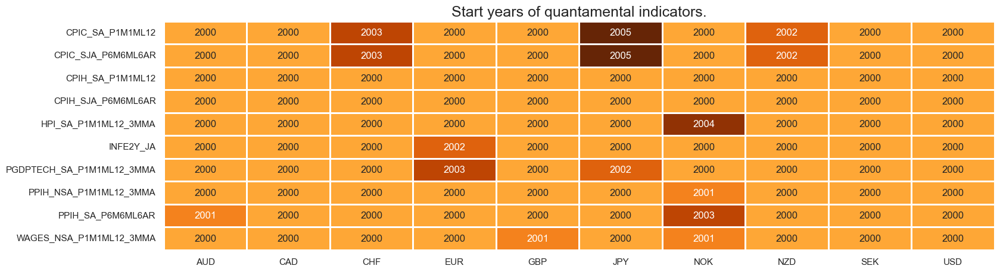

In [9]:
xcatx = infp
msm.check_availability(df=dfx, xcats=xcatx, cids=cids, missing_recent=False)

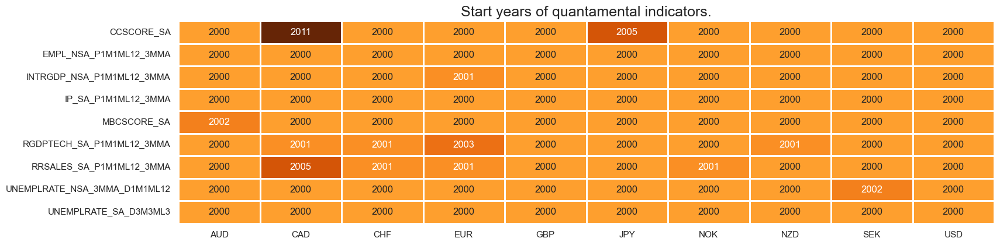

In [10]:
xcatx = actd
msm.check_availability(df=dfx, xcats=xcatx, cids=cids, missing_recent=False)

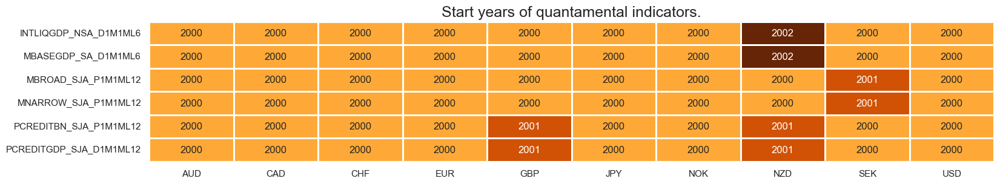

In [11]:
xcatx = mocr
msm.check_availability(df=dfx, xcats=xcatx, cids=cids, missing_recent=False)

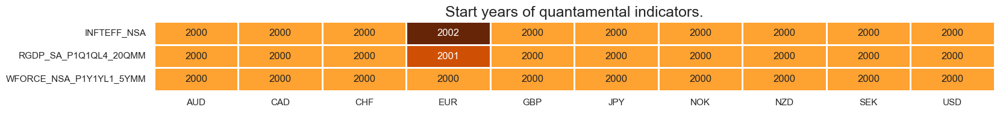

In [12]:
xcatx = adds
msm.check_availability(df=dfx, xcats=xcatx, cids=cids, missing_recent=False)

In [13]:
renaming_dict = {
    "XCPIC_SA_P1M1ML12_ZN": "Excess core CPI, %oya",
    "XCPIC_SJA_P6M6ML6AR_ZN": "Excess core CPI, %6m/6m, saar",
    "XCPIH_SA_P1M1ML12_ZN": "Excess headline CPI, %oya",
    "XCPIH_SJA_P6M6ML6AR_ZN": "Excess headline CPI, %6m/6m, saar",
    "XHPI_SA_P1M1ML12_3MMA_ZN": "Excess house prices, %oya, 3mma",
    "XINFE2Y_JA_ZN": "Excess 2-year CPI inflation expectations",
    "XPGDPTECH_SA_P1M1ML12_3MMA_ZN": "Excess output price growth, %oya, 3mma",
    "XPPIH_NSA_P1M1ML12_3MMA_ZN": "Excess PPI, %oya, 3mma",
    "XPPIH_SA_P6M6ML6AR_ZN": "Excess PPI, %6m/6m, saar",
    "XWAGES_NSA_P1M1ML12_3MMA_ZN": "Excess wage growth, %oya, 3mma",
    "XCCSCORE_SA_ZN": "Consumer confidence score, sa",
    "XEMPL_NSA_P1M1ML12_3MMA_ZN": "Excess employment growth, %oya, 3mma",
    "XINTRGDP_NSA_P1M1ML12_3MMA_ZN": "Excess 'intuitive' GDP growth, %oya, 3mma",
    "XRGDPTECH_SA_P1M1ML12_3MMA_ZN": "Excess 'technical' GDP growth, %oya, 3mma",
    "XIP_SA_P1M1ML12_3MMA_ZN": "Excess industrial production growth, %oya, 3mma",
    "XMBCSCORE_SA_ZN": "Manufacturing confidence score, sa",
    "XRRSALES_SA_P1M1ML12_3MMA_ZN": "Excess retail sales growth, %oya, 3mma",
    "XUNEMPLRATE_NSA_3MMA_D1M1ML12_NEG_ZN": "Excess unemployment change, oya, neg",
    "XUNEMPLRATE_SA_D3M3ML3_NEG_ZN": "Excess unemployment change, 3m/3m, saar, neg",
    "XINTLIQGDP_NSA_D1M1ML6_ZN": "Intervention liquidity, % over 6m",
    "XMBASEGDP_SA_D1M1ML6_ZN": "Monetary base expansion, % over 6m",
    "XMBROAD_SJA_P1M1ML12_ZN": "Excess broad money growth, %oya",
    "XMNARROW_SJA_P1M1ML12_ZN": "Excess narrow money growth, %oya",
    "XPCREDITBN_SJA_P1M1ML12_ZN": "Excess private credit growth, %oya",
    "XPCREDITGDP_SJA_D1M1ML12_ZN": "Excess private credit growth, change oya as %GDP",
}

## Transformation and checks

### Inflation pressure

In [14]:
# Deviations from estimated theoretical neutral levels
calcs = []

wages = ["WAGES_NSA_P1M1ML12_3MMA"]
oths = [xc for xc in infp if ((xc not in wages))]

for xc in wages:
    calcs += [f"X{xc} = {xc} - RGDP_SA_P1Q1QL4_20QMM + WFORCE_NSA_P1Y1YL1_5YMM - INFTEFF_NSA"]

for xc in oths:
    calcs += [f"X{xc} = {xc} - INFTEFF_NSA"]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids)
dfx = msm.update_df(dfx, dfa)

xinfp = list(dfa['xcat'].unique())

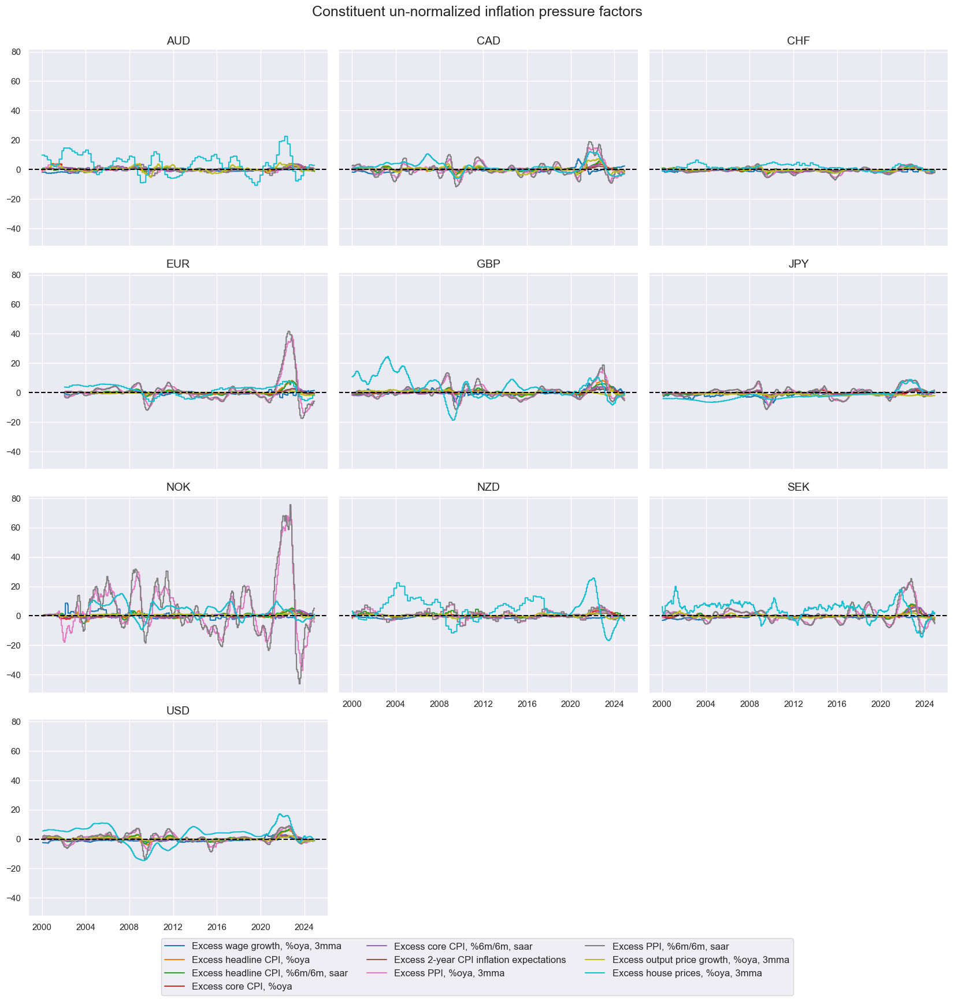

In [15]:
xcatx = xinfp

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=3,
    aspect = 1.3,
    start="2000-01-01",
    same_y=True,
    title = "Constituent un-normalized inflation pressure factors",
    xcat_labels=[renaming_dict[x + "_ZN"] for x in xcatx]
)

In [16]:
# Normalize and winsorize categories

xcatx = xinfp

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cids,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

xinfp_zn = list(dfa['xcat'].unique())

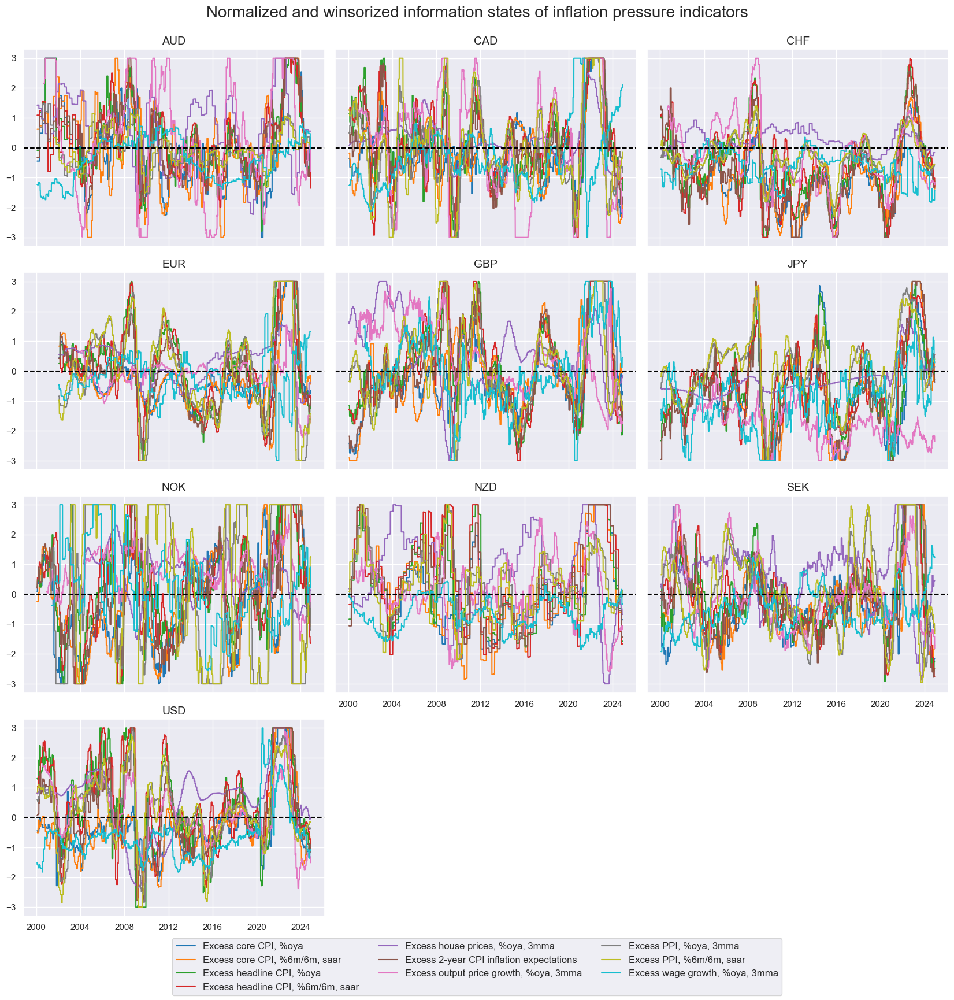

In [17]:
xcatx = xinfp_zn

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    title="Normalized and winsorized information states of inflation pressure indicators",
    title_fontsize=20,
    ncol=3,
    aspect = 1.3,
    start="2000-01-01",
    same_y=True,
    xcat_labels=[renaming_dict[x] for x in xcatx],
)

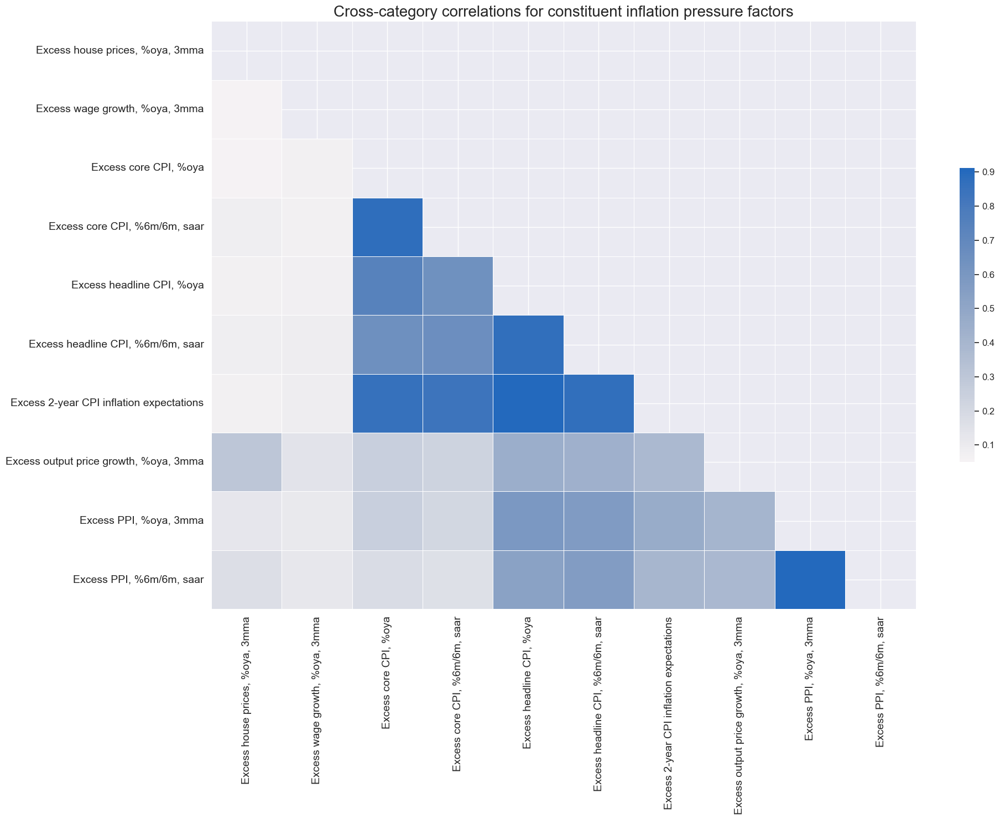

In [18]:
xcatx = xinfp_zn

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    cids=cids,
    freq="M",
    size=(20, 15),
    cluster=True,
    title = "Cross-category correlations for constituent inflation pressure factors",
    xcat_labels=[renaming_dict[x] for x in xcatx]
    
)

In [19]:
# Calculate conceptual parity
xcatx = xinfp_zn

dfaa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cids,
    complete_xcats=True,  # all xcats required at par with PCA
    new_xcat="XINFP_C",
)

# Re-scoring to compensate diversification effect
dfa = msp.make_zn_scores(
        dfaa,
        xcat="XINFP_C",
        cids=cids,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="ZN",
        est_freq="m",
    )

dfx = msm.update_df(dfx, dfa)

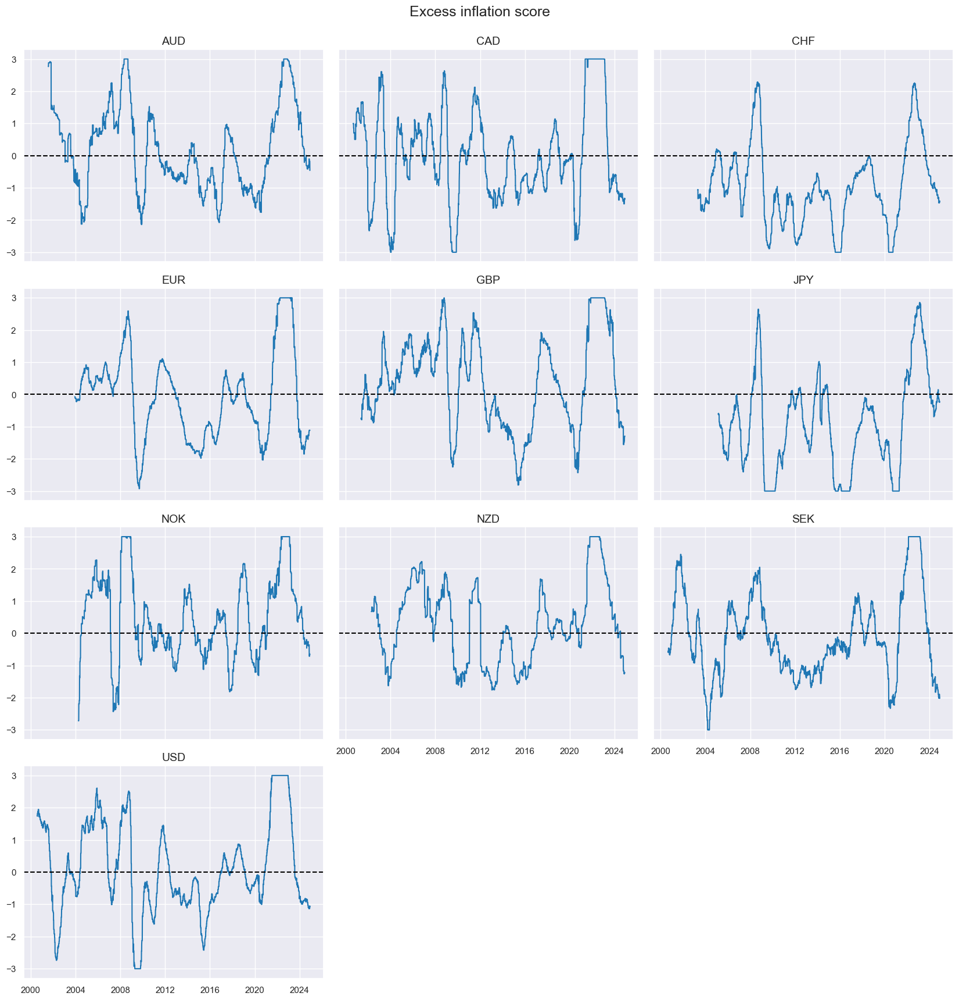

In [20]:
xcatx = ["XINFP_CZN"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=3,
    aspect = 1.3,
    start="2000-01-01",
    same_y=True,
    title = "Excess inflation score"
)

### Activity and demand growth

In [21]:
calcs = []

scores = ["MBCSCORE_SA", "CCSCORE_SA"]
emps = ["EMPL_NSA_P1M1ML12_3MMA"]
umps = ["UNEMPLRATE_NSA_3MMA_D1M1ML12", "UNEMPLRATE_SA_D3M3ML3"]
labors = emps + umps
growth = [xc for xc in actd if ((xc not in scores) and (xc not in labors))]

for xc in scores:
    calcs += [f"X{xc} = {xc}"]
for xc in growth:
    calcs += [f"X{xc} = {xc} - RGDP_SA_P1Q1QL4_20QMM"]
for xc in emps:
    calcs += [f"X{xc} = {xc} - WFORCE_NSA_P1Y1YL1_5YMM"]
for xc in umps:
    calcs += [f"X{xc}_NEG = - {xc}"]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids)
dfx = msm.update_df(dfx, dfa)

xactd = list(dfa["xcat"].unique())

In [22]:
# Normalize and winsorize categories

xcatx = xactd

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cids,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

xactd_zn = list(dfa['xcat'].unique())

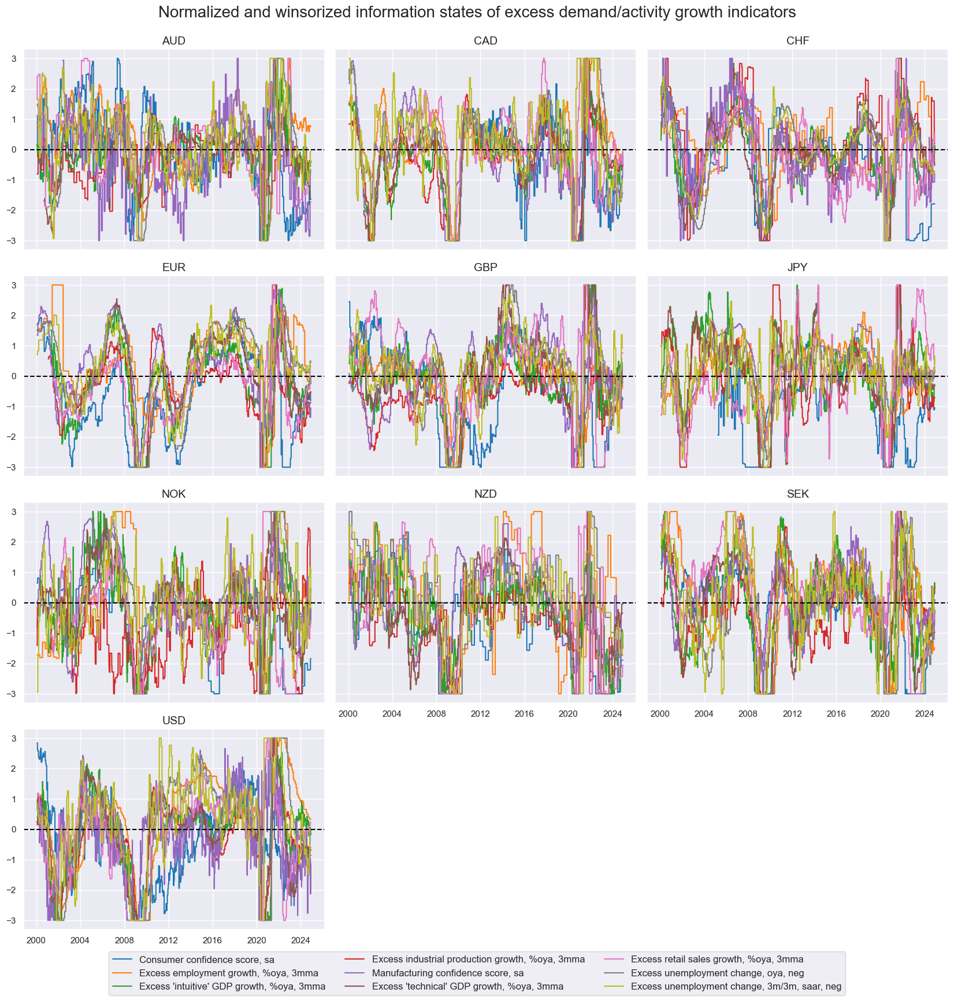

In [23]:
xcatx = xactd_zn

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    title="Normalized and winsorized information states of excess demand/activity growth indicators",
    title_fontsize=20,
    ncol=3,
    aspect = 1.3,
    start="2000-01-01",
    same_y=True,
    xcat_labels=[renaming_dict[x] for x in xcatx],
)

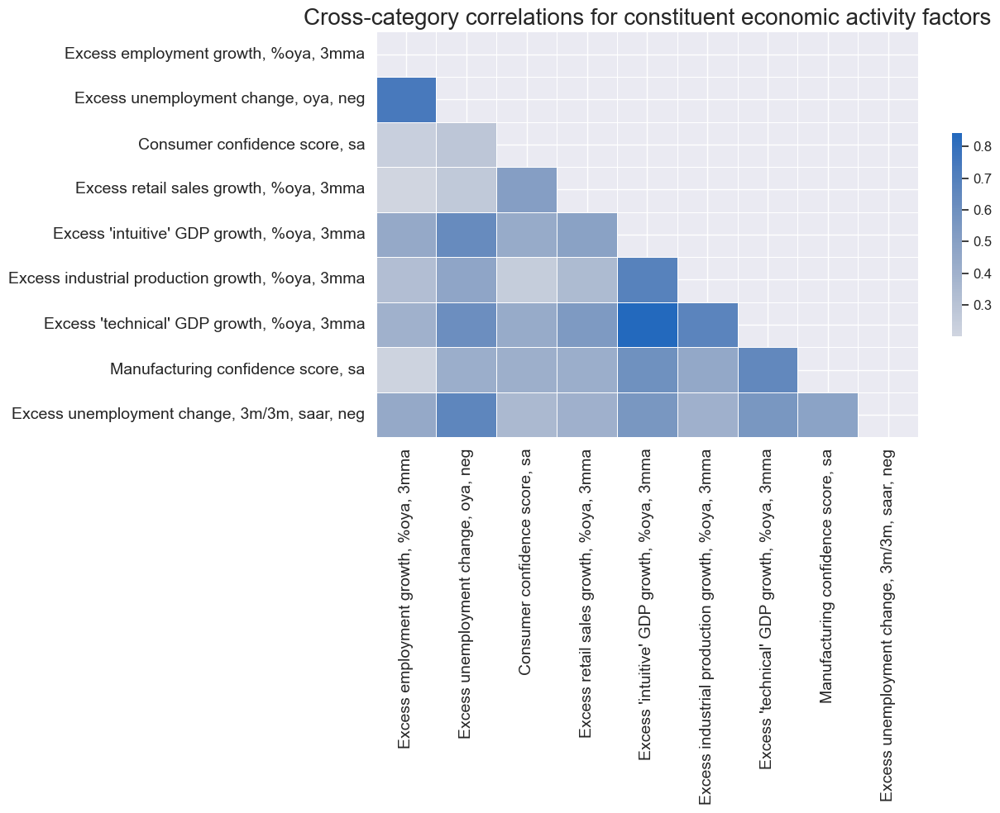

In [24]:
xcatx = xactd_zn

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    cids=cids,
    freq="M",
    size=(13, 10),
    cluster=True,
    title = "Cross-category correlations for constituent economic activity factors",
    xcat_labels=[renaming_dict[x] for x in xcatx],
)

In [25]:
# Calculate conceptual parity
xcatx = xactd_zn

dfaa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cids,
    complete_xcats=True,  # all xcats required at par with PCA
    new_xcat="XACTD_C",
)

# Re-scoring to compensate diversification effect
dfa = msp.make_zn_scores(
        dfaa,
        xcat="XACTD_C",
        cids=cids,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="ZN",
        est_freq="m",
    )

dfx = msm.update_df(dfx, dfa)

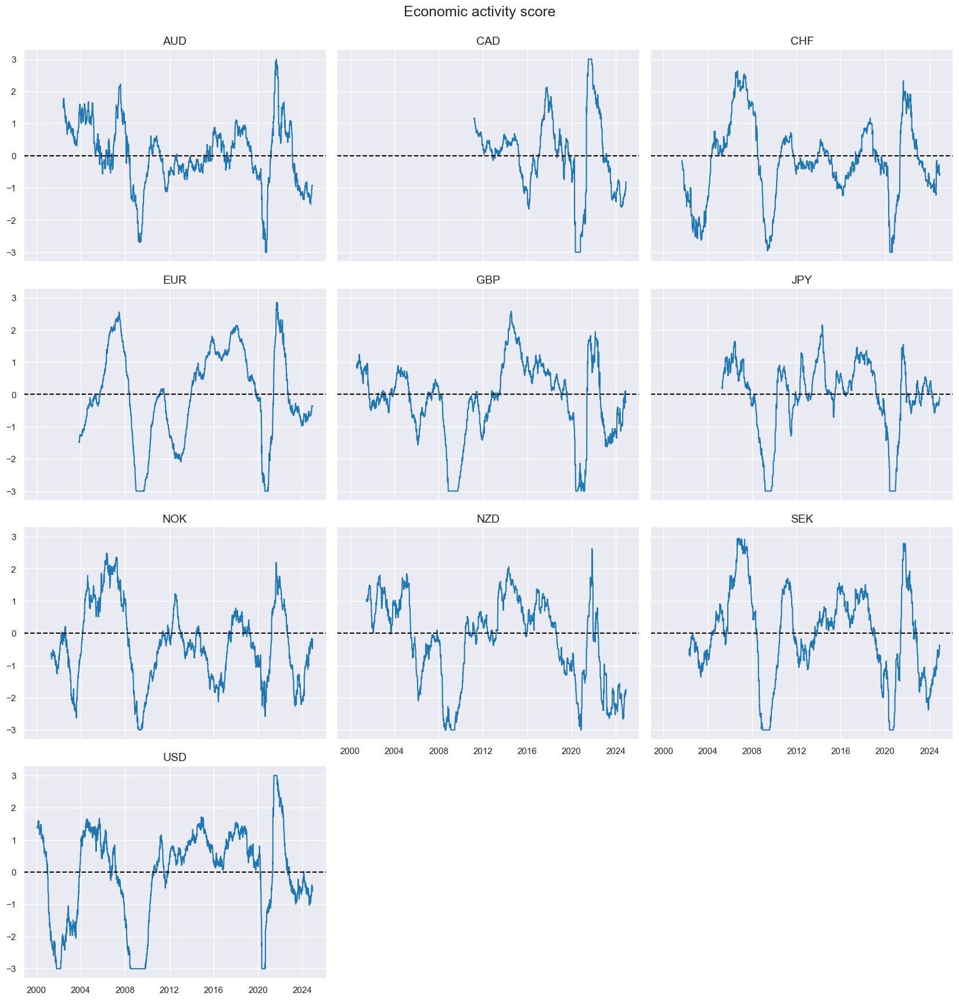

In [26]:
xcatx = ["XACTD_CZN"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=3,
    aspect = 1.3,
    start="2000-01-01",
    same_y=True,
    title = "Economic activity score",
)

### Money and credit growth

In [27]:
# Deviations from estimated theoretical neutral levels
calcs = []

liqs = ["MBASEGDP_SA_D1M1ML6", "INTLIQGDP_NSA_D1M1ML6"]
mocr_1y = [xc for xc in mocr if xc not in liqs]

for xc in liqs:
    calcs += [f"X{xc} = {xc}"]

for xc in mocr_1y:
    calcs += [f"X{xc} = {xc} - ( RGDP_SA_P1Q1QL4_20QMM + INFTEFF_NSA )"]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids)
dfx = msm.update_df(dfx, dfa)

xmocr = list(dfa['xcat'].unique())

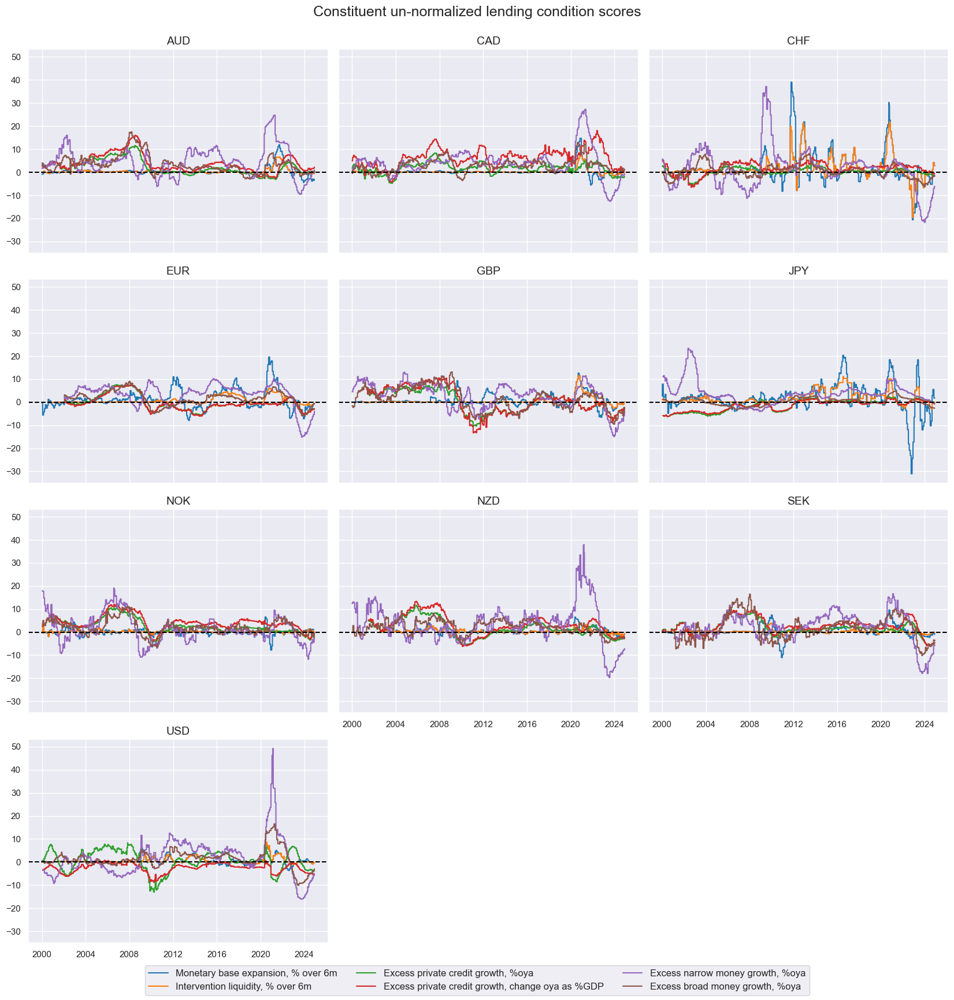

In [28]:
xcatx = xmocr

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=3,
    aspect = 1.3,
    start="2000-01-01",
    same_y=True,
    title = "Constituent un-normalized lending condition scores",
    xcat_labels=[renaming_dict[x + "_ZN"] for x in xcatx]
)

In [29]:
# Normalize and winsorize categories

xcatx = xmocr

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cids,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

xmocr_zn = list(dfa['xcat'].unique())

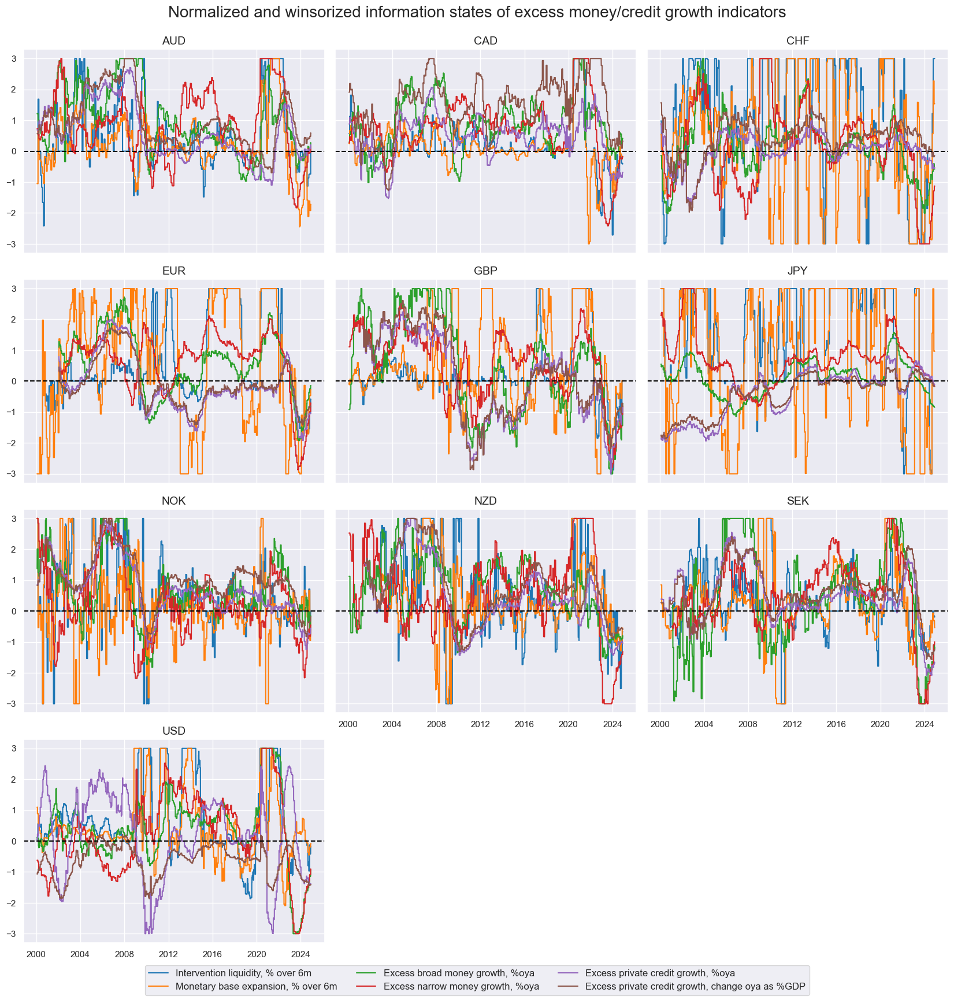

In [30]:
xcatx = xmocr_zn

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    title="Normalized and winsorized information states of excess money/credit growth indicators",
    title_fontsize=20,
    ncol=3,
    aspect = 1.3,
    start="2000-01-01",
    same_y=True,
    xcat_labels=[renaming_dict[x] for x in xcatx],
)

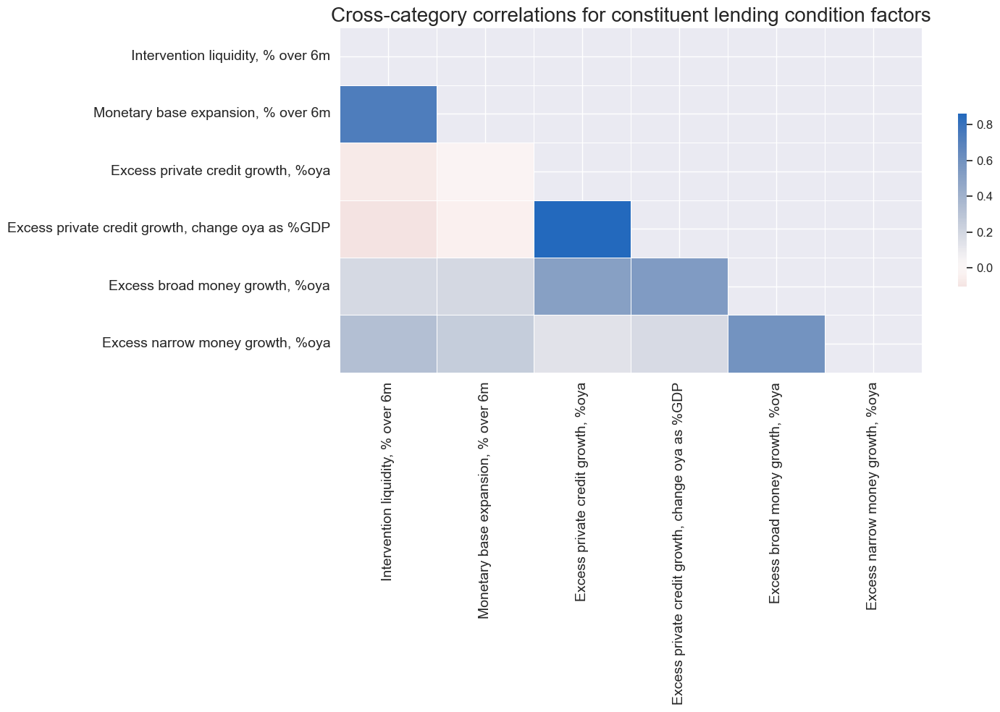

In [31]:
xcatx = xmocr_zn

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    cids=cids,
    freq="M",
    size=(15, 10),
    cluster=True,
    title = "Cross-category correlations for constituent lending condition factors",
    xcat_labels=[renaming_dict[x] for x in xcatx],
)

In [32]:
# Calculate conceptual parity
xcatx = xmocr_zn

dfaa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cids,
    complete_xcats=True,  # all xcats required at par with PCA
    new_xcat="XMOCR_C",
)

# Re-scoring to compensate diversification effect
dfa = msp.make_zn_scores(
        dfaa,
        xcat="XMOCR_C",
        cids=cids,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="ZN",
        est_freq="m",
    )

dfx = msm.update_df(dfx, dfa)

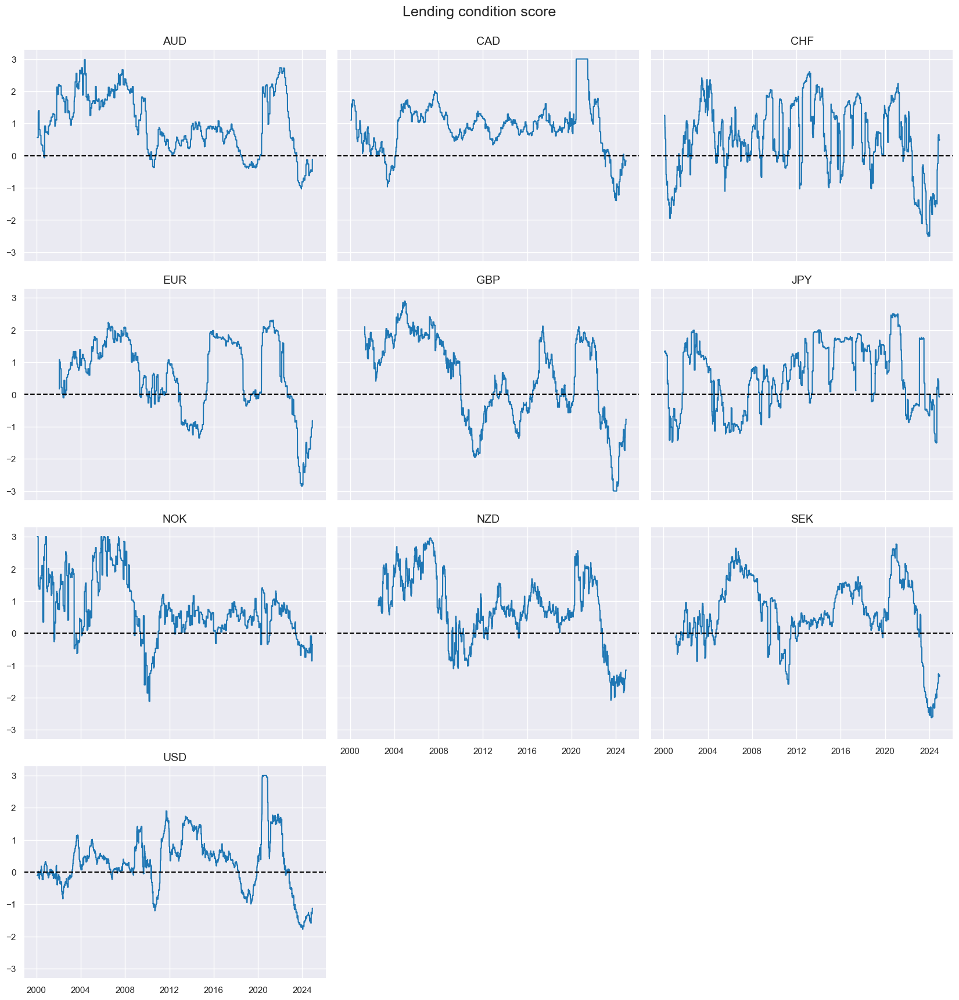

In [33]:
xcatx = ["XMOCR_CZN"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=3,
    aspect = 1.3,
    start="2000-01-01",
    same_y=True,
    title = "Lending condition score"
)

### Comparison

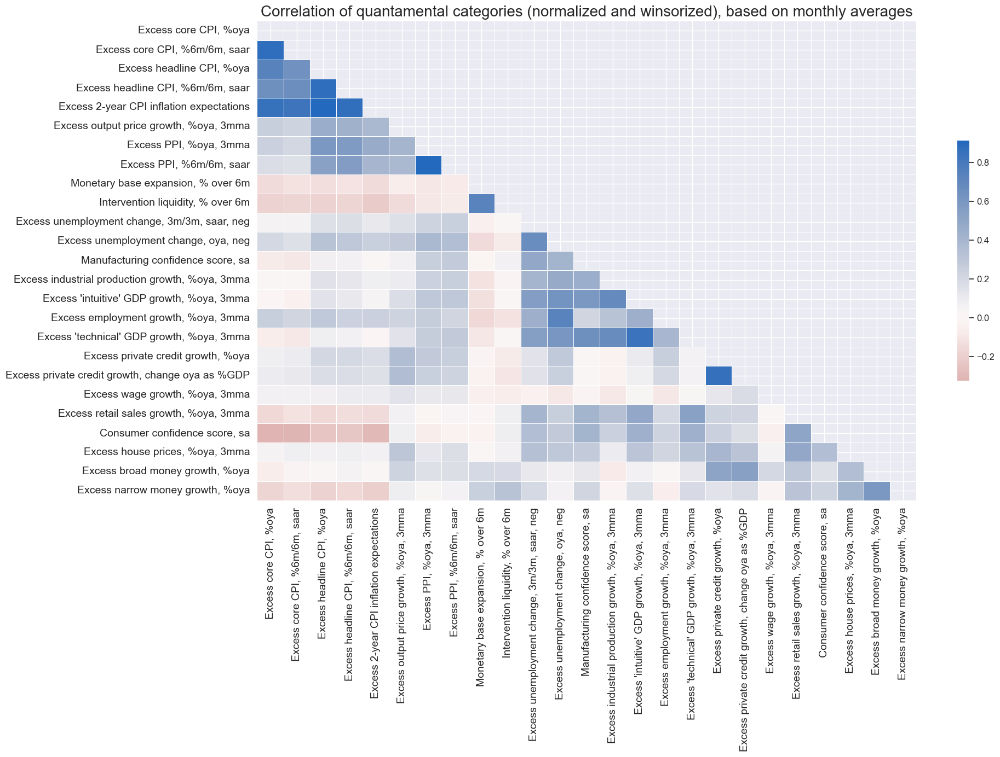

In [34]:
xcatx = xinfp_zn + xactd_zn + xmocr_zn
cidx = cids

sdate = "2000-01-01"

msp.correl_matrix(
    dfx,
    xcats=list(renaming_dict.keys()),
    cids=cidx,
    start=sdate,
    freq="M",
    cluster=True,
    title="Correlation of quantamental categories (normalized and winsorized), based on monthly averages",
    xcat_labels = list(renaming_dict.values()),
    size=(20, 14),
)

### Target returns

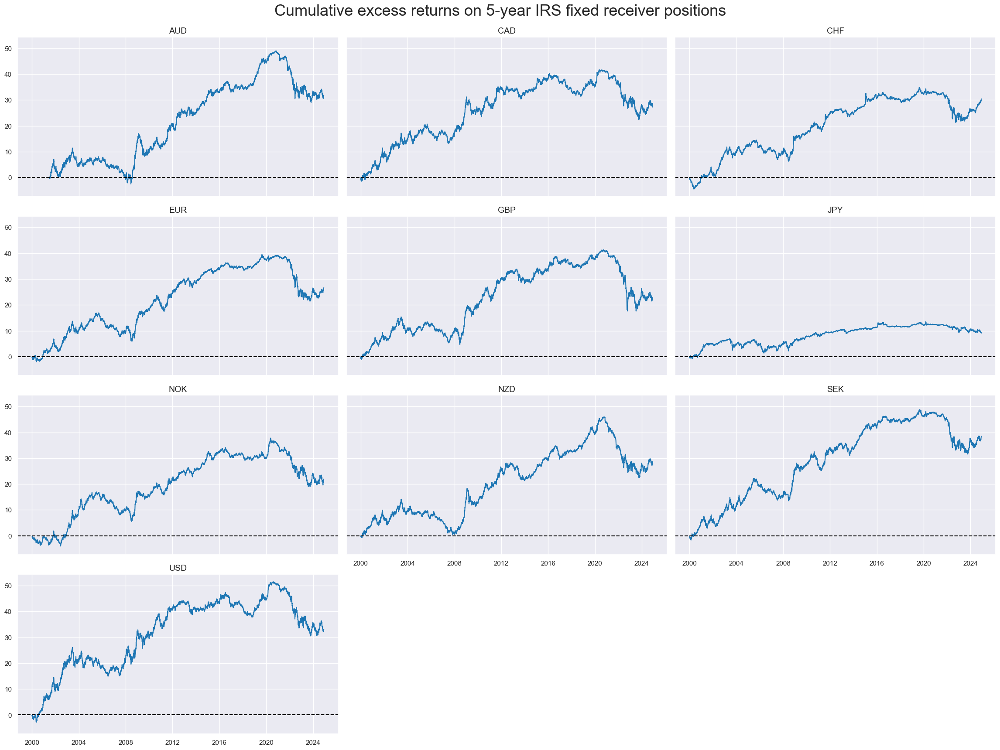

In [35]:
xcatx = ["DU05YXR_NSA"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cumsum=True,
    cids=cids,
    ncol=3,
    aspect = 1.8,
    start="2000-01-01",
    same_y=True,
    title="Cumulative excess returns on 5-year IRS fixed receiver positions",
    title_fontsize=26,
)

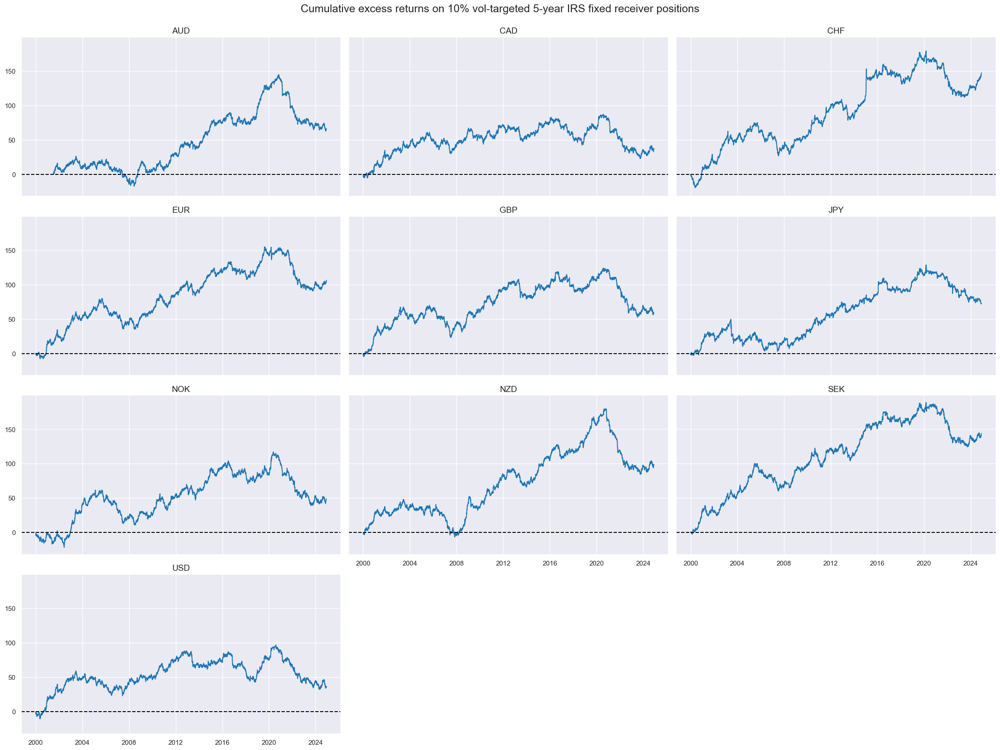

In [36]:
xcatx = ["DU05YXR_VT10"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cumsum=True,
    cids=cids,
    ncol=3,
    aspect = 1.8,
    start="2000-01-01",
    same_y=True,
    title="Cumulative excess returns on 10% vol-targeted 5-year IRS fixed receiver positions",
)

## Signal generation

### Conceptual parity

In [37]:
# Calculate conceptual parity
conceptz = ["XINFP_CZN", "XACTD_CZN", "XMOCR_CZN"]
xcatx = conceptz

dfaa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cids,
    complete_xcats=True,  # all xcats required at par with PCA
    new_xcat="CPAR_C",
)

# Re-scoring to compensate diversification effect
dfa = msp.make_zn_scores(
        dfaa,
        xcat="CPAR_C",
        cids=cids,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="ZN",
        est_freq="m",
    )

dfx = msm.update_df(dfx, dfa)

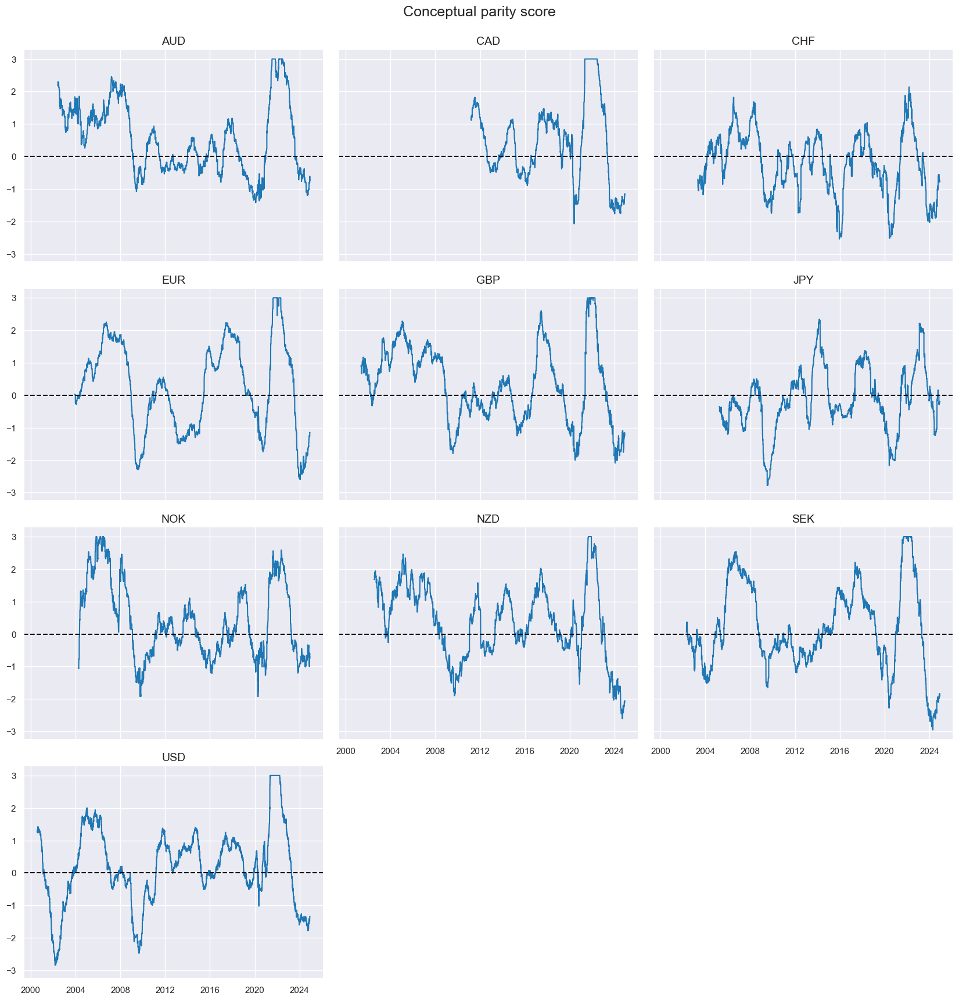

In [38]:
xcatx = ["CPAR_CZN"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=3,
    aspect = 1.3,
    start="2000-01-01",
    same_y=True,
    title = "Conceptual parity score"
)

In [39]:
calcs = []

allz = ["XINFP_CZN", "XACTD_CZN", "XMOCR_CZN", "CPAR_CZN"]
for xc in allz:
    calcs += [f"{xc}_NEG = - {xc}"]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids)
dfx = msm.update_df(dfx, dfa)

allz_neg = list(dfa['xcat'].unique())

### Prepare data and parameters for learning

In [40]:
# Monthly-frequency data in sklearn format

xcatx = xinfp_zn + xactd_zn + xmocr_zn + ["DU05YXR_NSA"]

so_dur = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cids,
    freq = "M",
    lag = 1,
    xcat_aggs = ["last", "sum"],
)

In [41]:
xcatx = ["XINFP_CZN", "XACTD_CZN", "XMOCR_CZN"] + ["DU05YXR_NSA"]

so_crp = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cids,
    freq = "M",
    lag = 1,
    xcat_aggs = ["last", "sum"],
)

### Learning parameters

In [42]:
# Choose scorer and splitter
# Balanced accuracy does a better job than R2 in containing the effect of outlier periods in validation folds, high vol periods and bad seasonality
scorer = {"BAC": make_scorer(msl.regression_balanced_accuracy, greater_is_better=True)}
splitter = {"Expanding": msl.ExpandingKFoldPanelSplit(n_splits = 3)}
add_splits = {"Expanding": lambda n: n // 36}

### Linear regression with constituent factors

In [43]:
# Sequential learning

so_dur.calculate_predictions(
    name="REG_LR",
    inner_splitters = splitter,
    models={
        "OLS": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("lr", LinearRegression()),
            ]
        ),
    },
    scorers = scorer,
    hyperparameters = {
        "OLS": {},
    },
    search_type = "grid",
    min_cids = 3,
    min_periods = 36,
    split_functions = add_splits,
)

dfa = so_dur.get_optimized_signals("REG_LR")
dfx = msm.update_df(dfx, dfa)

  0%|          | 0/236 [00:00<?, ?it/s]

### Linear regression with conceptual factors

In [44]:
# Sequential learning

so_crp.calculate_predictions(
    name="REG_LR_CRP",
    models={
        "OLS": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("lr", LinearRegression()),
            ]
        ),
    },
    scorers=scorer,
    hyperparameters={
        "OLS": {},
    },
    search_type="grid",
    min_cids=3,
    min_periods=36,
    split_functions = add_splits,
    inner_splitters = splitter,
)

dfa = so_crp.get_optimized_signals("REG_LR_CRP")
dfx = msm.update_df(dfx, dfa)

  0%|          | 0/236 [00:00<?, ?it/s]

### Linear regression with PCA-reduced conceptual factors

In [45]:
# Sequential learning

so_crp.calculate_predictions(
    name="REG_GPCA_CRP",
    models={
        "PLS_variance": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("pca", msl.PanelPCA(adjust_signs = True)),
                ("scaler2", StandardScaler()),
                ("lr", LinearRegression()),
            ]
        ),
        "PLS_kaiser": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("pca", msl.PanelPCA(kaiser_criterion=True, adjust_signs = True)),
                ("scaler2", StandardScaler()),
                ("lr", LinearRegression()),
            ]
        ),
    },
    scorers=scorer,
    hyperparameters={
        "PLS_variance": {},
        "PLS_kaiser": {}
    },
    search_type="grid",
    min_cids=3,
    min_periods=36,
    split_functions = add_splits,
    inner_splitters = splitter,
)

dfa = so_crp.get_optimized_signals("REG_GPCA_CRP")
dfx = msm.update_df(dfx, dfa)

  0%|          | 0/236 [00:00<?, ?it/s]

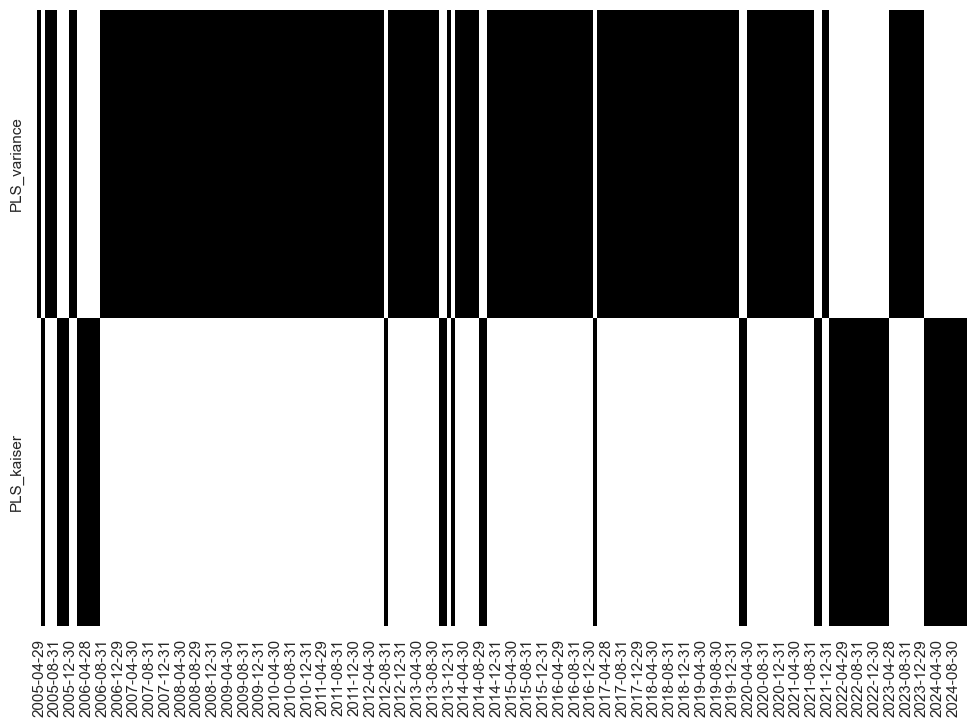

In [46]:
so_crp.models_heatmap("REG_GPCA_CRP")

### General PCA with regression-based learning ("kitchen sink")

In [47]:
# Sequential learning

so_dur.calculate_predictions(
    name="REG_GPCA",
    models={
        "PLS_variance": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("pca", msl.PanelPCA(adjust_signs = True)),
                ("scaler2", StandardScaler()),
                ("lr", LinearRegression()),
            ]
        ),
        "PLS_kaiser": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("pca", msl.PanelPCA(kaiser_criterion=True, adjust_signs = True)),
                ("scaler2", StandardScaler()),
                ("lr", LinearRegression()),
            ]
        ),
    },
    scorers=scorer,
    hyperparameters={
        "PLS_variance": {"pca__n_components": [0.95, 3]},
        "PLS_kaiser": {}
    },
    search_type="grid",
    min_cids=3,
    min_periods=36,
    split_functions = add_splits,
    inner_splitters = splitter,
    store_correlations=True
)

dfa = so_dur.get_optimized_signals("REG_GPCA")
dfx = msm.update_df(dfx, dfa)

  0%|          | 0/236 [00:00<?, ?it/s]

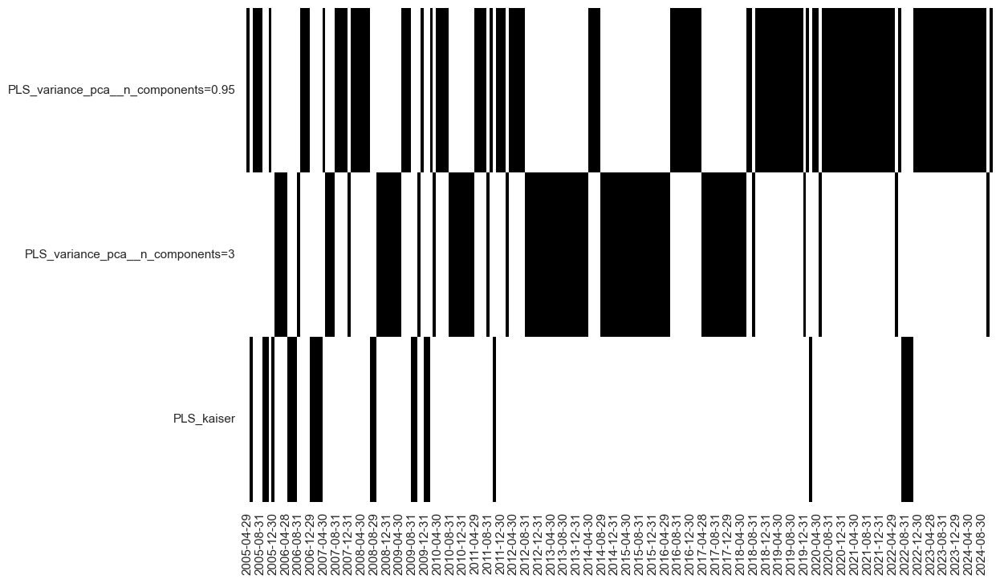

In [48]:
so_dur.models_heatmap("REG_GPCA")

### Single-stage groupwise PCA (uses intra-group PCs as regressors)

In [49]:
# Sequential learning

so_dur.calculate_predictions(
    name="REG_1SPCA",
    models={
        "PLS_group_kaiser": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("ct", ColumnTransformer([
                    ("pca_infp", msl.PanelPCA(kaiser_criterion=True, adjust_signs = True), xinfp_zn),
                    ("pca_xactd", msl.PanelPCA(kaiser_criterion=True, adjust_signs = True), xactd_zn),
                    ("pca_mocr", msl.PanelPCA(kaiser_criterion=True, adjust_signs = True), xmocr_zn),
                ])),
                ("scaler2", StandardScaler()),
                ("lr", LinearRegression()),
            ]
        ),
        "PLS_group_variance_0.95": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("ct", ColumnTransformer([
                    ("pca_infp", msl.PanelPCA(n_components=0.95, adjust_signs = True), xinfp_zn),
                    ("pca_xactd", msl.PanelPCA(n_components=0.95, adjust_signs = True), xactd_zn),
                    ("pca_mocr", msl.PanelPCA(n_components=0.95, adjust_signs = True), xmocr_zn),

                ])),
                ("scaler2", StandardScaler()),
                ("lr", LinearRegression()),
            ]
        ),
        "PLS_group_vars_3": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("ct", ColumnTransformer([
                    ("pca_infp", msl.PanelPCA(n_components=3, adjust_signs = True), xinfp_zn),
                    ("pca_xactd", msl.PanelPCA(n_components=3, adjust_signs = True), xactd_zn),
                    ("pca_mocr", msl.PanelPCA(n_components=3, adjust_signs = True), xmocr_zn),

                ])),
                ("scaler2", StandardScaler()),
                ("lr", LinearRegression()),
            ]
        ),
    },
    scorers=scorer,
    hyperparameters={
        "PLS_group_kaiser": {},
        "PLS_group_variance_0.95": {},
        "PLS_group_vars_3": {},
    },
    search_type="grid",
    min_cids=3,
    min_periods=24,
    split_functions = add_splits,
    inner_splitters = splitter,
)

dfa = so_dur.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

  0%|          | 0/248 [00:00<?, ?it/s]

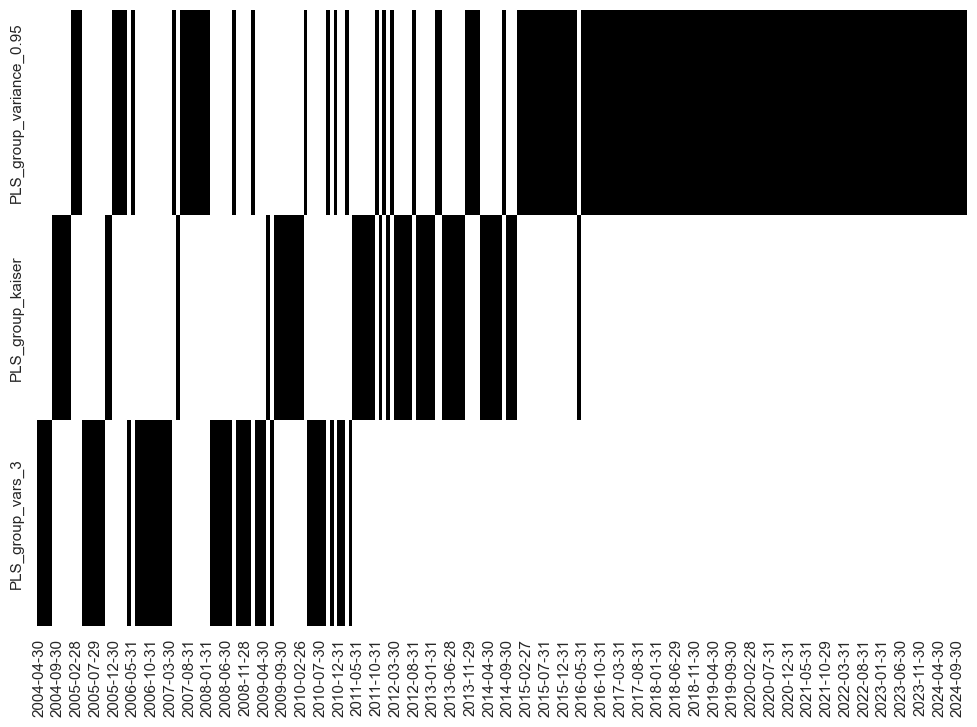

In [50]:
so_dur.models_heatmap("REG_1SPCA")

### 2-stage groupwise PCA (principal components of principal components)

In [51]:
# Sequential learning

so_dur.calculate_predictions(
    name="REG_2SPCA",
    models={
        "PLS_2group_variance_0.95": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("ct", ColumnTransformer([
                    ("pca_infp", msl.PanelPCA(n_components=0.95, adjust_signs = True), xinfp_zn),
                    ("pca_xactd", msl.PanelPCA(n_components=0.95, adjust_signs = True), xactd_zn),
                    ("pca_mocr", msl.PanelPCA(n_components=0.95, adjust_signs = True), xmocr_zn),
                ])),
                ("scaler2", StandardScaler()),
                ("pca", PCA()),
                ("lr", LinearRegression()),
            ]
        ),
        "PLS_2group_kaiser": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("ct", ColumnTransformer([
                    ("pca_infp", msl.PanelPCA(kaiser_criterion=True, adjust_signs = True), xinfp_zn),
                    ("pca_xactd", msl.PanelPCA(kaiser_criterion=True, adjust_signs = True), xactd_zn),
                    ("pca_mocr", msl.PanelPCA(kaiser_criterion=True, adjust_signs = True), xmocr_zn),
                ])),
                ("scaler2", StandardScaler()),
                ("pca", PCA()),
                ("lr", LinearRegression()),
            ]
        ),
        "PLS_2group_vars_3": Pipeline(
            [
                ("scaler", msl.PanelStandardScaler()),
                ("ct", ColumnTransformer([
                    ("pca_infp", msl.PanelPCA(n_components=3), xinfp_zn),
                    ("pca_xactd", msl.PanelPCA(n_components=3), xactd_zn),
                    ("pca_mocr", msl.PanelPCA(n_components=3), xmocr_zn),
                ])),
                ("scaler2", StandardScaler()),
                ("pca", PCA()),
                ("lr", LinearRegression()),
            ]
        ),
    },
    scorers=scorer,
    hyperparameters={
        "PLS_2group_variance_0.95": {"pca__n_components": [0.99, 0.95, 0.9]},
        "PLS_2group_kaiser": {"pca__n_components": [0.99, 0.95, 0.9]},
        "PLS_2group_vars_3": {"pca__n_components": [0.99, 0.95, 0.9]},
    },
    search_type="grid",
    min_cids=3,
    min_periods=24,
    split_functions = add_splits,
    inner_splitters = splitter,
)

dfa = so_dur.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

  0%|          | 0/248 [00:00<?, ?it/s]

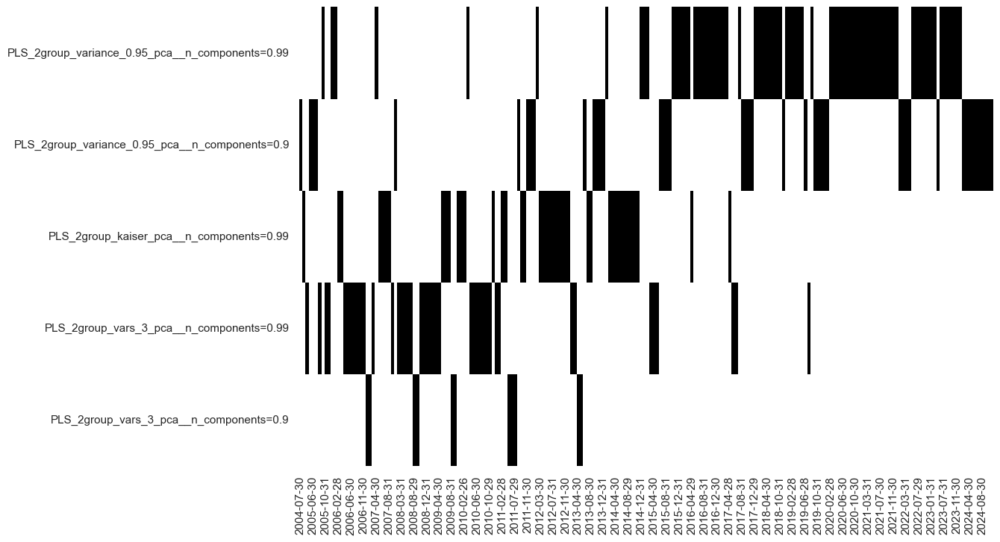

In [52]:
so_dur.models_heatmap("REG_2SPCA")

## Value checks

### Principal component interpretation

The first component of the standard PCA has generally captured a growth score, but with later convergence towards an inflation score.

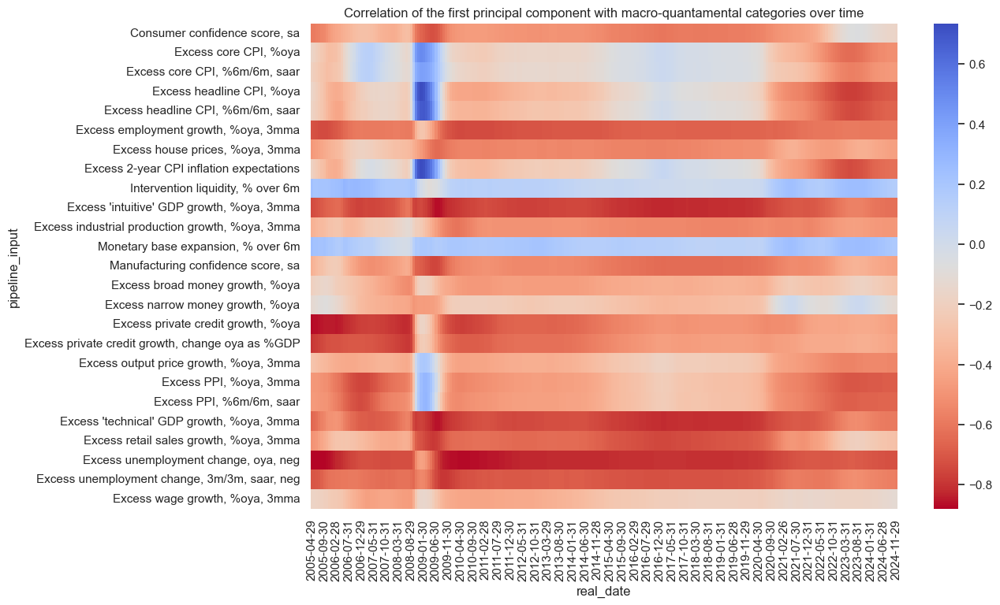

In [53]:
so_dur.correlations_heatmap(
    "REG_GPCA", "Feature 1", ftrs_renamed=renaming_dict, 
    title="Correlation of the first principal component with macro-quantamental categories over time"
)

As expected from the first component, the second component has tended to have the opposite relation, typically representing an inflation factor, transitioning into a growth factor.

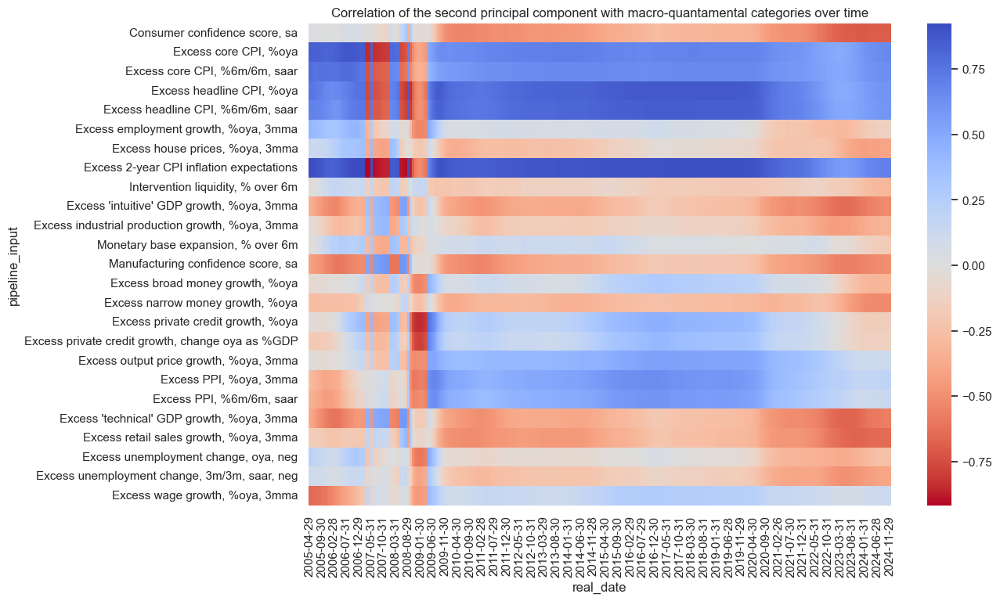

In [54]:
so_dur.correlations_heatmap(
    "REG_GPCA", "Feature 2", ftrs_renamed=renaming_dict, 
    title="Correlation of the second principal component with macro-quantamental categories over time"
)

The third component has converged towards capturing lending conditions.

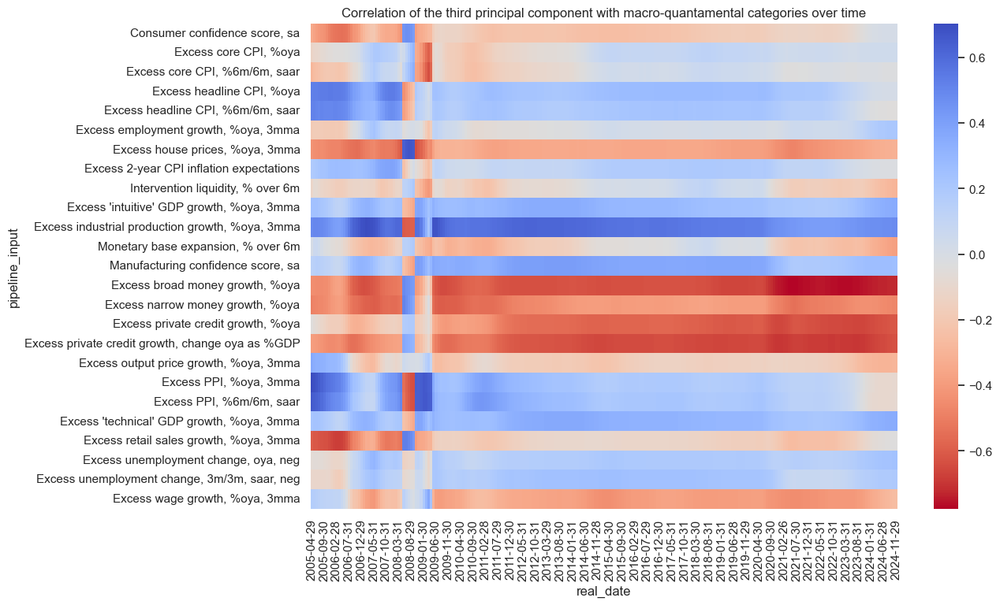

In [55]:
so_dur.correlations_heatmap(
    "REG_GPCA", "Feature 3", ftrs_renamed=renaming_dict,
    title="Correlation of the third principal component with macro-quantamental categories over time"
)

### Specs and correlation

In [56]:
all_labels = {
    "CPAR_CZN_NEG": "Two-stage conceptual parity score",
    "REG_LR_CRP": "Regression with conceptual parity score",
    "REG_GPCA": "Kitchen-sink PCA approach",
    "REG_1SPCA": "Groupwise single-stage PCA approach",
    "REG_2SPCA": "Groupwise 2-stage PCA approach",
    "REG_GPCA_CRP": "Groupwise conceptual-PCA approach",
}

dict_all = {
    "sigs": [key for key in all_labels.keys()],
    "targs": ["DU05YXR_NSA", "DU05YXR_VT10"],
    "cids": cids,
    "start": "2004-01-01",
    "freqs": ["M"],
    "cr": None,
    "srr": None,
    "pnls": None,
}

In [57]:
dix = dict_all

sigx = dix["sigs"]  # List of signal names
targx = dix["targs"][0]  # Assuming only one target for simplicity
cidx = dix["cids"]  # cids selection
start = dix["start"] # start date of analysis

cr_all = {}

for sig in sigx:
    cr_all[f"cr_{sig}"] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targx],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        xcat_trims=[30, 30]
    )

dix["cr"] = cr_all

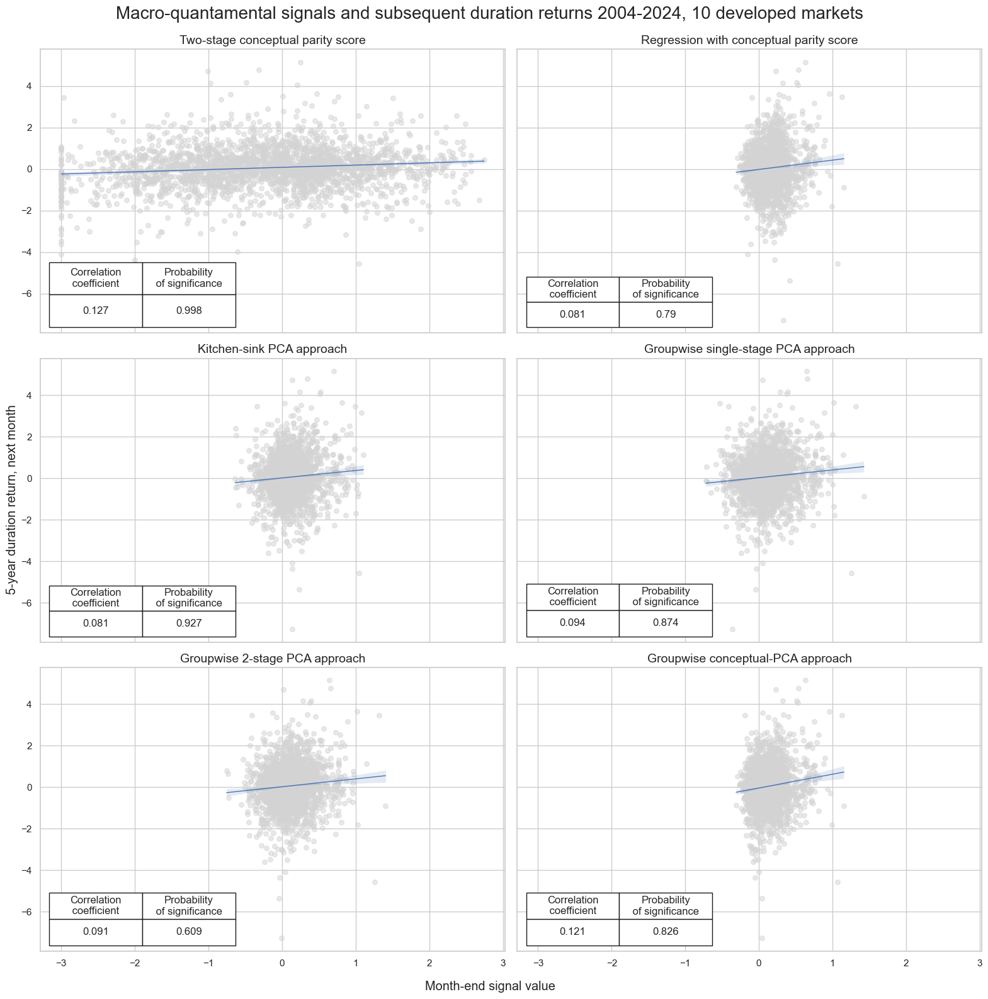

In [58]:
dix = dict_all
cr = dix["cr"]


msv.multiple_reg_scatter(
    cat_rels = [cr["cr_"+ key] for key in list(all_labels.keys())],
    title="Macro-quantamental signals and subsequent duration returns 2004-2024, 10 developed markets",
    xlab="Month-end signal value",
    ylab="5-year duration return, next month",
    ncol=2,
    nrow=3,
    figsize=(16, 16),
    prob_est="map",
    coef_box="lower left",
    subplot_titles=[lab for lab in list(all_labels.values())],
)

In [59]:
dix = dict_all

sigx = dix["sigs"]  # List of signal names
targx = dix["targs"][0]  # Assuming only one target for simplicity
cidx = ["USD"]  # cids selection
start = dix["start"] # start date of analysis

cr_all = {}

for sig in sigx:
    cr_all[f"cr_{sig}"] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targx],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        xcat_trims=[30, 30]
    )

dix["cr_usd"] = cr_all

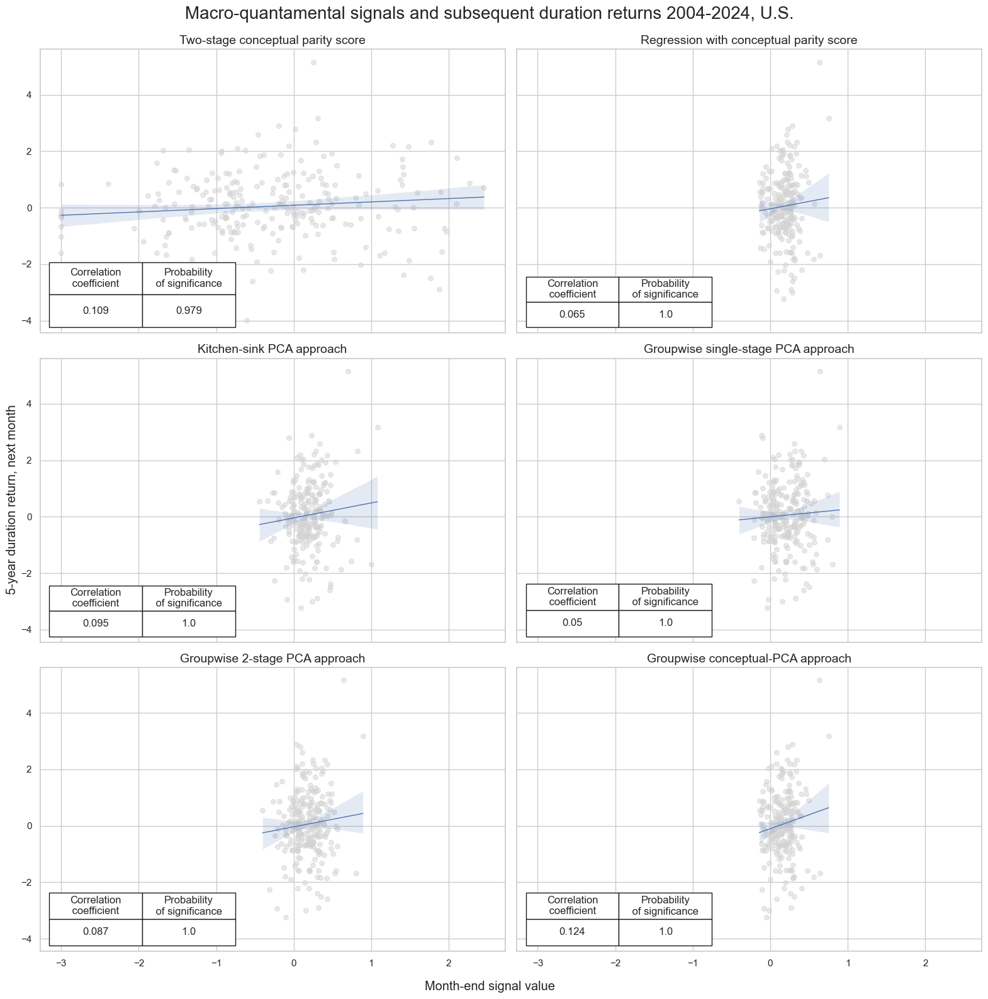

In [60]:
dix = dict_all
cr = dix["cr_usd"]


msv.multiple_reg_scatter(
    cat_rels = [cr["cr_"+ key] for key in list(all_labels.keys())],
    title="Macro-quantamental signals and subsequent duration returns 2004-2024, U.S.",
    xlab="Month-end signal value",
    ylab="5-year duration return, next month",
    ncol=2,
    nrow=3,
    figsize=(16, 16),
    prob_est="map",
    coef_box="lower left",
    subplot_titles=[lab for lab in list(all_labels.values())],
)

### Accuracy and correlation check

In [61]:
dix = dict_all

sigx = dix["sigs"]
targx = dix["targs"][0]
cidx = dix["cids"]
start = dix["start"]
freqs = dix["freqs"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigx,
    rets=targx,
    freqs=freqs,
    start=start,
)

dix["srr"] = srr

In [62]:
dix = dict_all
srr = dix["srr"]

# srr.multiple_relations_table()

tbxx = (
    srr.multiple_relations_table( freqs=freqs)
    .reset_index(level=["Aggregation", "Frequency", "Return"], drop=True)
)



tbxx.style.format("{:.3f}")

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Signal,,,,,,,,,,,
CPAR_CZN_NEG,0.517,0.522,0.448,0.546,0.571,0.474,0.127,0.000,0.072,0.000,0.522
REG_1SPCA,0.547,0.536,0.676,0.546,0.569,0.503,0.094,0.000,0.063,0.000,0.532
REG_2SPCA,0.548,0.536,0.686,0.546,0.568,0.504,0.091,0.000,0.061,0.000,0.531
REG_GPCA,0.531,0.515,0.721,0.543,0.552,0.479,0.081,0.000,0.048,0.001,0.512
REG_GPCA_CRP,0.536,0.518,0.779,0.543,0.551,0.484,0.121,0.000,0.067,0.000,0.512
REG_LR_CRP,0.526,0.500,0.803,0.543,0.543,0.457,0.081,0.000,0.048,0.001,0.500


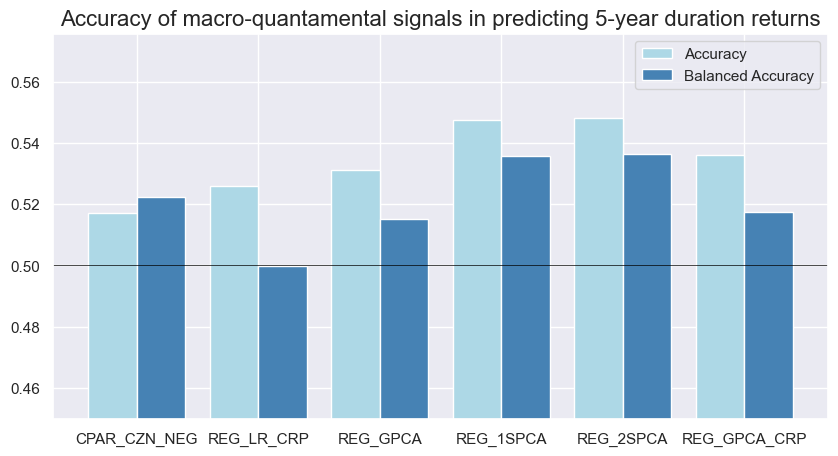

In [63]:
dix = dict_all
srr = dix["srr"]

srr.accuracy_bars(
    type="signals",
    title="Accuracy of macro-quantamental signals in predicting 5-year duration returns",
    size=(10, 5),
)

### Naive PnLs

In [64]:
dix = dict_all

sigx = dix["sigs"]
targx = dix["targs"][0]
cidx = dix["cids"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targx,
    sigs=sigx,
    cids=cidx,
    start=start,
    bms=["USD_GB10YXR_NSA", "USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="binary",
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_BIN",
    )

    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

dix["pnls"] = naive_pnl

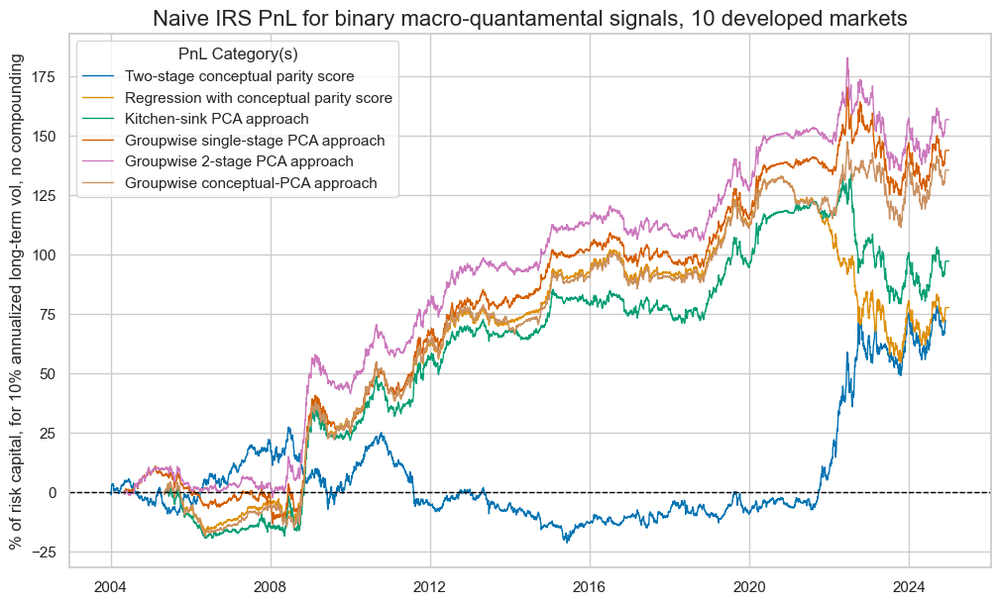

In [65]:
dix = dict_all

start = dix["start"]
cidx = dix["cids"]
sigx = dix["sigs"]
pnlx = dix["pnls"]

pnls = [sig + "_BIN" for sig in sigx] 

pnl_all={key + "_BIN": value for key, value in all_labels.items()}
pnl_all_labels= {key: pnl_all[key] for key in list(pnl_all)}


pnlx.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    title="Naive IRS PnL for binary macro-quantamental signals, 10 developed markets",
    title_fontsize=16,
    xcat_labels=pnl_all_labels,
    ylab="% of risk capital, for 10% annualized long-term vol, no compounding",
    start=start,
)

In [66]:
dix = dict_all

start = dix["start"]
cidx = dix["cids"]
pnlx = dix["pnls"]
sigx = dix["sigs"]
pnls = [sig + "_BIN" for sig in sigx]

df_eval = pnlx.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    )

df_eval = df_eval.rename(columns=all_labels)

# apply style and heading

df_eval = df_eval.style.format("{:.2f}").set_caption(
    f"Performance metrics"
    ).set_table_styles(
    [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}
    ])

display(df_eval)


xcat,CPAR_CZN_NEG_BIN,REG_LR_CRP_BIN,REG_GPCA_BIN,REG_1SPCA_BIN,REG_2SPCA_BIN,REG_GPCA_CRP_BIN
Return %,3.46,3.95,4.94,6.96,7.58,6.89
St. Dev. %,10.00,10.00,10.00,10.00,10.00,10.00
Sharpe Ratio,0.35,0.39,0.49,0.70,0.76,0.69
Sortino Ratio,0.49,0.60,0.75,1.03,1.12,1.05
Max 21-Day Draw %,-15.33,-17.10,-20.62,-18.55,-18.58,-11.55
Max 6-Month Draw %,-22.33,-26.71,-34.47,-29.50,-30.51,-25.77
Peak to Trough Draw %,-48.65,-78.35,-54.49,-45.55,-47.49,-36.08
Top 5% Monthly PnL Share,1.79,1.56,1.22,0.86,0.78,0.92
USD_GB10YXR_NSA correl,-0.07,0.61,0.47,0.36,0.37,0.48
USD_EQXR_NSA correl,-0.01,-0.18,-0.15,-0.20,-0.19,-0.22


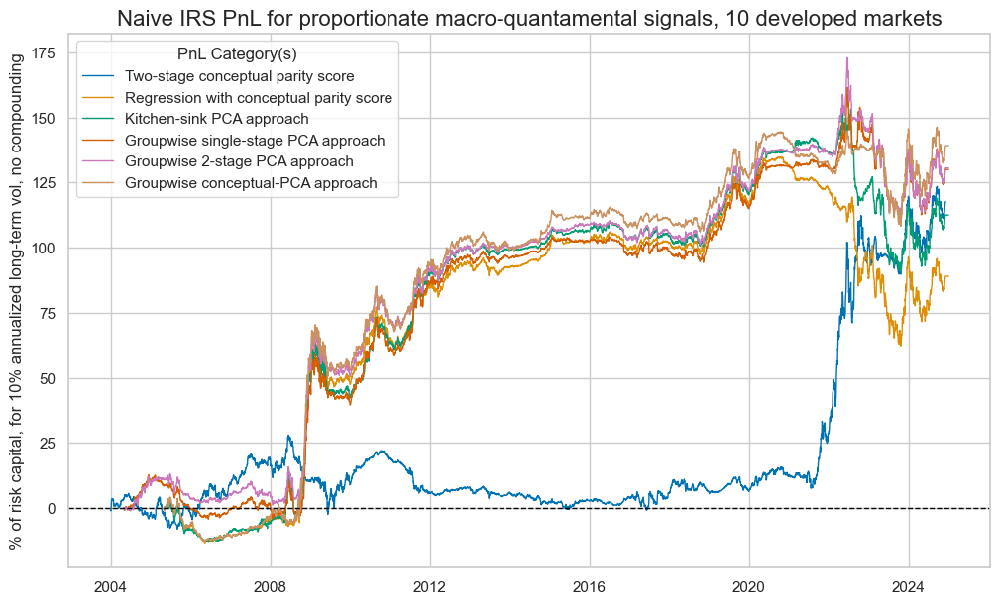

In [67]:
dix = dict_all

start = dix["start"]
cidx = dix["cids"]
sigx = dix["sigs"]
pnlx = dix["pnls"]

pnls = [sig + "_PZN" for sig in sigx] 

pnl_all={key + "_PZN": value for key, value in all_labels.items()}
pnl_all_labels= {key: pnl_all[key] for key in list(pnl_all)}


pnlx.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    title="Naive IRS PnL for proportionate macro-quantamental signals, 10 developed markets",
    title_fontsize=16,
    xcat_labels=pnl_all_labels,
    ylab="% of risk capital, for 10% annualized long-term vol, no compounding",
    start=start,
)

In [68]:
dix = dict_all

start = dix["start"]
cidx = dix["cids"]
pnlx = dix["pnls"]
sigx = dix["sigs"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = pnlx.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    )

df_eval = df_eval.rename(columns=all_labels)

# apply style and heading

df_eval = df_eval.style.format("{:.2f}").set_caption(
    f"Performance metrics"
    ).set_table_styles(
    [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}
    ])

display(df_eval)

xcat,CPAR_CZN_NEG_PZN,REG_LR_CRP_PZN,REG_GPCA_PZN,REG_1SPCA_PZN,REG_2SPCA_PZN,REG_GPCA_CRP_PZN
Return %,5.63,4.53,5.72,6.29,6.32,7.08
St. Dev. %,10.00,10.00,10.00,10.00,10.00,10.00
Sharpe Ratio,0.56,0.45,0.57,0.63,0.63,0.71
Sortino Ratio,0.82,0.70,0.87,0.94,0.94,1.11
Max 21-Day Draw %,-21.00,-19.91,-21.52,-17.36,-17.83,-13.45
Max 6-Month Draw %,-17.25,-30.41,-32.90,-30.89,-34.45,-28.56
Peak to Trough Draw %,-30.93,-72.57,-62.39,-49.83,-61.04,-36.54
Top 5% Monthly PnL Share,1.33,1.57,1.19,1.04,1.05,1.06
USD_GB10YXR_NSA correl,-0.11,0.60,0.47,0.38,0.38,0.53
USD_EQXR_NSA correl,-0.01,-0.18,-0.16,-0.18,-0.18,-0.22


In [69]:
dix = dict_all

sigx = dix["sigs"]
targx = dix["targs"][1]
cidx = dix["cids"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targx,
    sigs=sigx,
    cids=cidx,
    start=start,
    bms=["USD_GB10YXR_NSA", "USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="binary",
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_BINVT",
    )

    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZNVT",
    )

dix["pnls_vt"] = naive_pnl

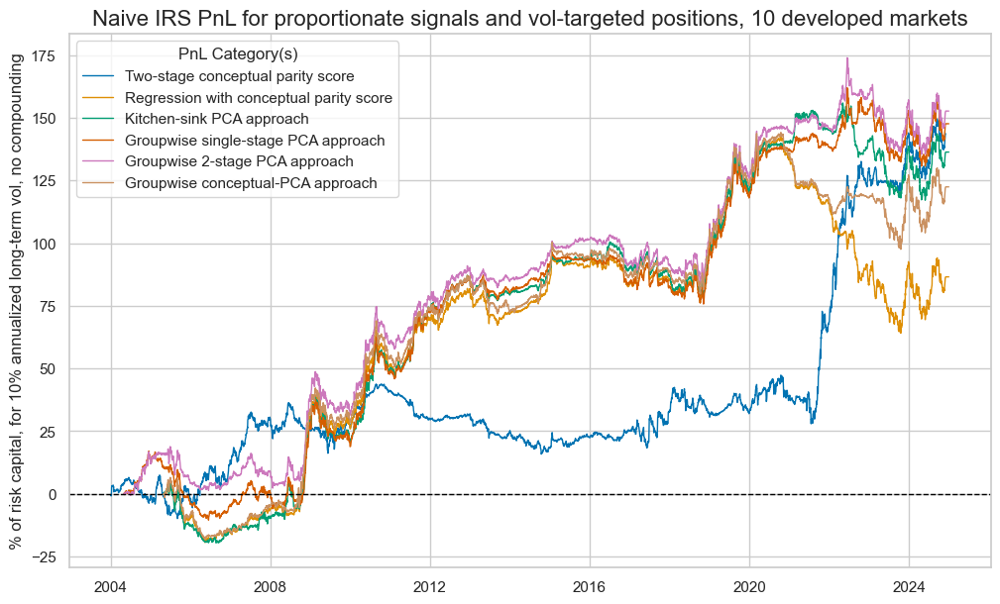

In [70]:
dix = dict_all

start = dix["start"]
cidx = dix["cids"]
sigx = dix["sigs"]
pnlx = dix["pnls_vt"]

pnls = [sig + "_PZNVT" for sig in sigx] 

pnl_all={key + "_PZNVT": value for key, value in all_labels.items()}
pnl_all_labels= {key: pnl_all[key] for key in list(pnl_all)}


pnlx.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    title="Naive IRS PnL for proportionate signals and vol-targeted positions, 10 developed markets",
    title_fontsize=16,
    xcat_labels=pnl_all_labels,
    ylab="% of risk capital, for 10% annualized long-term vol, no compounding",
    start=start,
)

In [71]:
dix = dict_all

start = dix["start"]
cidx = dix["cids"]
pnlx = dix["pnls_vt"]
sigx = dix["sigs"]
pnls = [sig + "_PZNVT" for sig in sigx]

df_eval = pnlx.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    )

df_eval = df_eval.rename(columns=all_labels)

# apply style and heading

df_eval = df_eval.style.format("{:.2f}").set_caption(
    f"Performance metrics"
    ).set_table_styles(
    [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}
    ])

display(df_eval)

xcat,CPAR_CZN_NEG_PZNVT,REG_LR_CRP_PZNVT,REG_GPCA_PZNVT,REG_1SPCA_PZNVT,REG_2SPCA_PZNVT,REG_GPCA_CRP_PZNVT
Return %,6.87,4.40,6.93,7.15,7.39,6.23
St. Dev. %,10.00,10.00,10.00,10.00,10.00,10.00
Sharpe Ratio,0.69,0.44,0.69,0.71,0.74,0.62
Sortino Ratio,1.02,0.67,1.06,1.06,1.10,0.95
Max 21-Day Draw %,-12.30,-14.91,-12.17,-12.62,-12.78,-12.67
Max 6-Month Draw %,-16.35,-20.92,-22.44,-22.32,-24.59,-20.48
Peak to Trough Draw %,-27.97,-78.40,-38.79,-31.29,-38.53,-46.65
Top 5% Monthly PnL Share,1.02,1.52,0.96,0.86,0.82,1.11
USD_GB10YXR_NSA correl,-0.09,0.57,0.47,0.40,0.39,0.51
USD_EQXR_NSA correl,-0.01,-0.18,-0.17,-0.18,-0.18,-0.20
